In [14]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from scipy import stats

import itertools

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
rates = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/Car_Rates.csv')
rates

,Car_name,Num_of_reviews,General_rate,Comfort,Interior design,Performance,Value for the money,Exterior styling,Reliability,Year,Brand,Model
0,2023 Acura Integra.,5.0,4.6,4.4,4.4,4.6,4.2,5.0,4.8,2023,Acura,Integra.
1,2023 Acura MDX.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023,Acura,MDX.
2,2023 Acura TLX.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023,Acura,TLX.
3,2023 Acura RDX.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023,Acura,RDX.
4,2022 Acura TLX.,3.0,4.8,4.3,4.3,4.7,5.0,5.0,5.0,2022,Acura,TLX.
...,...,...,...,...,...,...,...,...,...,...,...,...
4238,2012 Volvo C70.,23.0,4.5,4.5,4.4,4.4,4.3,4.8,4.4,2012,Volvo,C70.
4239,2012 Volvo XC70.,11.0,4.5,4.6,4.5,4.5,4.5,4.6,4.5,2012,Volvo,XC70.
4240,2012 Volvo XC90.,11.0,4.4,4.9,4.3,4.1,4.5,4.2,4.5,2012,Volvo,XC90.
4241,2012 Volvo C30.,6.0,4.6,5.0,4.7,4.7,4.2,4.8,3.8,2012,Volvo,C30.


In [ ]:
rates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4243 entries, 0 to 4242
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Car_name             4243 non-null   object 
 1   Num_of_reviews       3679 non-null   float64
 2   General_rate         3679 non-null   float64
 3   Comfort              3679 non-null   float64
 4   Interior design      3679 non-null   float64
 5   Performance          3679 non-null   float64
 6   Value for the money  3679 non-null   float64
 7   Exterior styling     3679 non-null   float64
 8   Reliability          3664 non-null   float64
 9   Year                 4243 non-null   int64  
 10  Brand                4243 non-null   object 
 11  Model                4243 non-null   object 
dtypes: float64(8), int64(1), object(3)
memory usage: 397.9+ KB


Car_name                 0
Num_of_reviews         564
General_rate           564
Comfort                564
Interior design        564
Performance            564
Value for the money    564
Exterior styling       564
Reliability            579
Year                     0
Brand                    0
Model                    0
dtype: int64
Car_name               0.000000
Num_of_reviews         0.132925
General_rate           0.132925
Comfort                0.132925
Interior design        0.132925
Performance            0.132925
Value for the money    0.132925
Exterior styling       0.132925
Reliability            0.136460
Year                   0.000000
Brand                  0.000000
Model                  0.000000
dtype: float64


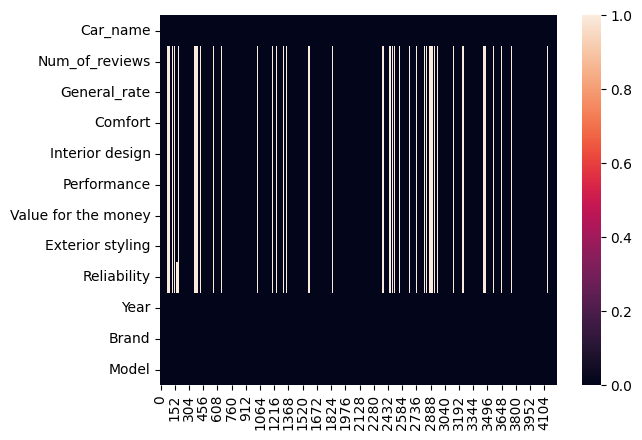

In [ ]:
print(rates.isnull().sum())
print(rates.isnull().sum() / len(rates))
sns.heatmap(rates.T.isnull())
plt.show()

In [ ]:
cars = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/New_York_cars.csv')
cars

,new&used,name,money,Exterior color,Interior color,Drivetrain,MPG,Fuel type,Transmission,Engine,...,Safety,Seating,Accidents or damage,Clean title,1-owner vehicle,Personal use only,brand,Year,Model,currency
0,New,2023 Acura Integra Base,33095,Liquid Carbon Metallic,Ebony,Fwd,30–37,Gasoline,Automatic Cvt,1.5L I4 16V Gdi Dohc Turbo,...,Automatic Emergency BrakingBackup CameraBrak...,Leather Seats,NaN,NaN,NaN,NaN,Acura,2023,Integra Base,$
1,New,2023 Acura Mdx A-Spec,61745,Majestic Black Pearl,Ebony,Awd,19–25,Gasoline,10-Speed Automatic,3.5L V6 24V Gdi Sohc,...,Backup CameraBrake AssistLane Departure Warn...,Leather SeatsMemory SeatThird Row Seating,NaN,NaN,NaN,NaN,Acura,2023,Mdx A-Spec,$
2,New,2023 Acura Integra A-Spec Technology,38095,Majestic Black Pearl,Ebony,Fwd,26–36,Gasoline,6-Speed Manual,1.5L I4 16V Gdi Dohc Turbo,...,Backup CameraBrake AssistLane Departure Warn...,Leather SeatsMemory Seat,NaN,NaN,NaN,NaN,Acura,2023,Integra A-Spec Technology,$
3,New,2023 Acura Tlx A-Spec,47995,Majestic Black Pearl,Ebony,Fwd,22–30,Gasoline,10-Speed Automatic,2.0L I4 16V Gdi Dohc Turbo,...,Backup CameraBrake AssistLane Departure Warn...,Leather SeatsMemory Seat,NaN,NaN,NaN,NaN,Acura,2023,Tlx A-Spec,$
4,New,2023 Acura Tlx A-Spec,47995,Platinum White Pearl,Red,Fwd,22–30,Gasoline,10-Speed Automatic,2.0L I4 16V Gdi Dohc Turbo,...,Backup CameraBrake AssistLane Departure Warn...,Leather SeatsMemory Seat,NaN,NaN,NaN,NaN,Acura,2023,Tlx A-Spec,$
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175485,Used,2012 Volvo Xc60 T6 R-Design,12700,Ice White,Soft Beige / Off Black,Awd,17–23,Gasoline,6-Speed Automatic,3.0L I6 24V Mpfi Dohc Turbo,...,Brake AssistStability Control,Leather SeatsMemory Seat,At Least 1 Accident Or Damage Reported,NaN,No,Yes,Volvo,2012,Xc60 T6 R-Design,$
175486,Used,2012 Volvo S80 T6,10999,Black Stone,Off Black,Awd,18–26,Gasoline,6-Speed Automatic,3.0L I6 24V Mpfi Dohc Turbo,...,Brake AssistStability Control,Leather SeatsMemory Seat,None Reported,NaN,No,Yes,Volvo,2012,S80 T6,$
175487,Used,2012 Volvo S60 T5,7999,Black Sapphire Metallic,Soft Beige / Off Black,Fwd,20–30,Gasoline,6-Speed Automatic,2.5L I5 20V Mpfi Dohc Turbo,...,Brake AssistStability Control,Memory Seat,None Reported,Yes,Yes,Yes,Volvo,2012,S60 T5,$
175488,Used,2012 Volvo Xc60 3.2,18998,Ice White,Sandstone Beige,Fwd,19–25,Gasoline,6-Speed Automatic,3.2L I6 24V Mpfi Dohc,...,Brake AssistStability Control,Leather SeatsMemory Seat,None Reported,Yes,No,Yes,Volvo,2012,Xc60 3.2,$


In [ ]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175490 entries, 0 to 175489
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   new&used             175490 non-null  object 
 1   name                 175490 non-null  object 
 2   money                175490 non-null  int64  
 3   Exterior color       173598 non-null  object 
 4   Interior color       160594 non-null  object 
 5   Drivetrain           174934 non-null  object 
 6   MPG                  143406 non-null  object 
 7   Fuel type            174147 non-null  object 
 8   Transmission         174726 non-null  object 
 9   Engine               175158 non-null  object 
 10  Mileage              175443 non-null  float64
 11  Convenience          145557 non-null  object 
 12  Entertainment        166583 non-null  object 
 13  Exterior             158582 non-null  object 
 14  Safety               173548 non-null  object 
 15  Seating          

new&used                    0
name                        0
money                       0
Exterior color           1892
Interior color          14896
Drivetrain                556
MPG                     32084
Fuel type                1343
Transmission              764
Engine                    332
Mileage                    47
Convenience             29933
Entertainment            8907
Exterior                16908
Safety                   1942
Seating                 57654
Accidents or damage     52574
Clean title            157340
1-owner vehicle         52799
Personal use only       52575
brand                       0
Year                        0
Model                       0
currency                    0
dtype: int64
new&used               0.000000
name                   0.000000
money                  0.000000
Exterior color         0.010781
Interior color         0.084882
Drivetrain             0.003168
MPG                    0.182825
Fuel type              0.007653
Transmissio

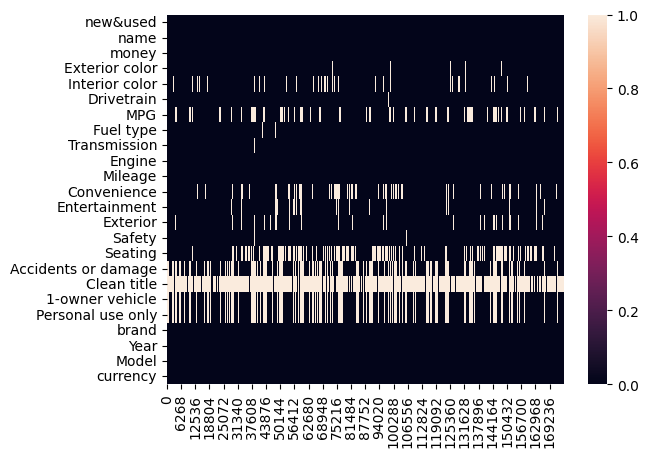

In [ ]:
print(cars.isnull().sum())
print(cars.isnull().sum() / len(cars))
sns.heatmap(cars.T.isnull())
plt.show()

Merge datasets

In [ ]:
# not all models in cars dataset are in rates dataset (uff)
print(rates.pivot_table('Year', index=['Brand', 'Model'], aggfunc='count'))
print(cars.pivot_table('Year', index=['brand', 'Model'], aggfunc='count'))

                                     Year
Brand Model                              
Acura ILX Hybrid.                       1
      ILX.                             10
      Integra.                          1
      MDX Sport Hybrid.                 4
      MDX.                             11
...                                   ...
Volvo XC60.                            12
      XC70.                             4
      XC90 Hybrid.                      5
      XC90 Recharge Plug-In Hybrid.     3
      XC90.                            11

[742 rows x 1 columns]
                                    Year
brand Model                             
Acura Ilx                             19
      Ilx 2.0L                        19
      Ilx 2.0L Technology              7
      Ilx 2.0L W/Premium Package       9
      Ilx 2.4L                        11
...                                  ...
Volvo Xc90 T6 Momentum 6 Passenger    34
      Xc90 T6 Momentum 7 Passenger   104
      Xc90 T6 R-Desi

In [ ]:
rates['Model_clean'] = rates['Model'].str.lower()
rates['Model_clean'] = rates['Model_clean'].str.replace('\s+', ' ', regex=True)
rates['Model_clean'] = rates['Model_clean'].str.replace('.', '', regex=False)

In [ ]:
cars['Model_clean'] = cars['Model'].str.lower()
cars['Model_clean'] = cars['Model_clean'].str.replace('\s+', ' ', regex=True)
cars['Model_clean'] = cars['Model_clean'].str.replace('.', '', regex=False)

Merging is difficult since names, models and brands usually do not correspond. We focus in the cars dataset

In [ ]:
data = pd.merge(cars, rates, left_on=['brand', 'Year', 'Model'], right_on=['Brand', 'Year', 'Model'])
data

,new&used,name,money,Exterior color,Interior color,Drivetrain,MPG,Fuel type,Transmission,Engine,...,Num_of_reviews,General_rate,Comfort,Interior design,Performance,Value for the money,Exterior styling,Reliability,Brand,Model_clean_y


# Data Cleaning

We try to understand the reason for each missing value and then we use multivariate imputer of sklearn to replace the remaining

Black is the most frequent value so we replace missing values with black in the feature Exterior color and Interior color

In [ ]:
cars['Interior color'].fillna('Black', inplace=True)
cars['Exterior color'].fillna('Black', inplace=True)

We replace Drivetrain missing values with Awd

In [ ]:
cars['Drivetrain'].fillna('Awd', inplace=True)

Gasolinge is the most popular fuel by far

In [ ]:
cars['Fuel type'].fillna('Gasoline', inplace=True)

Boolean features

In [ ]:
cars['Accidents or damage'].fillna('None Reported', inplace=True)
cars['Accidents or damage'] = cars['Accidents or damage'].map({'At Least 1 Accident Or Damage Reported': 1, 'None Reported': 0})

In [ ]:
cars['1-owner vehicle'].fillna('Yes', inplace=True)
cars['1-owner vehicle'] = cars['1-owner vehicle'].map({'Yes': 1, 'No': 0})

In [ ]:
cars['Personal use only'].fillna('Yes', inplace=True)
cars['Personal use only'] = cars['Personal use only'].map({'Yes': 1, 'No': 0})

Gasolin and Gasoline are the same

In [ ]:
cars.loc[cars['Fuel type'] == 'Gasolin', 'Fuel type'] = 'Gasoline'

## Feature engineering on MPG

We divide MPG into min MPG and max MPG

In [ ]:
cars['MPG'] = cars['MPG'].str.strip()

In [ ]:
cars['MPG_min'] = cars['MPG'].str.extract('([0-9]+)').astype(float)
cars['MPG_max'] = cars['MPG'].str.replace('([0-9]+)–', '', regex=True).astype(float)

## Feature engineering on Engine

Many different types of engines

In [ ]:
print(cars['Engine'].unique())
print(len(cars['Engine'].unique()))

['1.5L I4 16V Gdi Dohc Turbo' '3.5L V6 24V Gdi Sohc'
 '2.0L I4 16V Gdi Dohc Turbo' ...
 'This 2013 Volvo Xc60 Platinum Is A One Owner Car With Only 80,00'
 'Turbocharged Gas I6 3.0L/180' 'Turbocharged Gas I5 2.5L/154']
1317


We can extract information about liters

In [ ]:
liters = cars['Engine'].str.extract('([0-9]+\.[0-9]+)|([0-9]\-[0-9])')
liters[0] = liters[0].astype(float)
liters[1] = liters[1].str.replace('-', '.').astype(float)
liters = liters.sum(axis=1).replace(0.0, np.nan)
cars['Engine_liters'] = liters

There are some cars with no information about liters

In [ ]:
cars.loc[cars['Engine_liters'].isnull(), 'Engine'].unique()

array(['4 Cylinder Engine', 'V6 Cylinder Engine', '0.0L', 'I4',
       '8 Cylinder Engine', 'Hybrid', 'V6', 'Electric',
       '10 Cylinder Engine', 'Gasoline', nan, '12 Cylinder Engine',
       '4 Cylinder', 'Straight 6 Cylinder Engine', '3 Cylinder Engine',
       'Electric Motor', '6 Cylinder', '8 Cyl,', 'Dohc', '3 Cylinder',
       'I-4 Cyl', 'Vortec', '8 Cylinder', 'Diesel', 'Ohv',
       'V8 Flexible Fuel', '5 Cylinder Engine', 'V-6 Cyl', '6', 'Mpfi',
       '6 - Cyl.', '8', 'V-8 Cyl', '4', 'Flexible Fuel', 'V-6', 'Unknown',
       'V8',
       'Good Carfax, Drives Like New, No Issues, Panoramic Roof. Leather',
       'Flat 6 Cylinder Engine', 'I-6 Cyl', 'I4 Supercharged', 'I4 Turbo',
       'This 2013 Volvo Xc60 Platinum Is A One Owner Car With Only 80,00'],
      dtype=object)

Information about cylinders

In [ ]:
cylinders = cars['Engine'].str.extract('(I[0-9]+)|(V[0-9]+)|(I-[0-9]+)|(V-[0-9]+)|([0-9]+ Cylinder)|([0-9]+\-Cylinder)|([0-9]+ Cyl)|([0-9]+\-Cyl)')
# we replace NaN with zero to apply the sum and reduce the number of columns to one, then replace the remaining 0 with NaN since there are no info
cylinders[0] = cylinders[0].str.replace('I', '').astype(float).fillna(0)
cylinders[1] = cylinders[1].str.replace('V', '').astype(float).fillna(0)
cylinders[2] = cylinders[2].str.replace('I-', '').astype(float).fillna(0)
cylinders[3] = cylinders[3].str.replace('V-', '').astype(float).fillna(0)
cylinders[4] = cylinders[4].str.replace(' Cylinder', '').astype(float).fillna(0)
cylinders[5] = cylinders[5].str.replace('-Cylinder', '').astype(float).fillna(0)
cylinders[6] = cylinders[6].str.replace(' Cyl', '').astype(float).fillna(0)
cylinders[7] = cylinders[7].str.replace('-Cyl', '').astype(float).fillna(0)
cylinders = cylinders.sum(axis=1).replace(0.0, np.nan)
cars['Engine_cylinders'] = cylinders

In [ ]:
cars.loc[cars['Engine_cylinders'].isnull(), 'Engine'].unique()

array(['0.0L', '3.0 L', 'Hybrid', '2.0 Liter Tfsi', 'Electric', '3.0L',
       '2.0L', 'Gasoline', '3.0 Liter Tfsi', nan,
       '2.0L L4 Dohc 16V Turbo',
       'Engine: 3.0L Dohc 24 Valve Inline 6 Turbocharged',
       'Electric/Gas 0.65 L/39.5 Cu.In. Range Extender', 'Electric Motor',
       '3.0-Liter, Dual Overhead Cam (Dohc), 24-Valve, 300-Hp Inline 6-C',
       '2.0-Liter, Dual Overhead Cam (Dohc), 16-Valve, 240-Horsepower In',
       'Dohc', 'Turbocharged 1.3/', 'Turbocharged 1.2/',
       'Ecotec 1.2L Turbo',
       'Engine, Ecotec 1.2L Turbo (Gm-Estimated 137 Hp [102 Kw] @ 5,000 Rpm, 162 Lb-Ft Of Torque [219 Nm] @ 2,500 Rpm)',
       'Engine, Ecotec 1.3L Turbo (Gm-Estimated 155 Hp [115 Kw] @ 5,600 Rpm / 174 Lb-Ft Torque [236 Nm] @ 1,600 Rpm Fwd/Awd Models)',
       'Engine, Ecotec 1.3L Turbo', '2.0L L4 Dohc 16V',
       'Turbocharged 2.0L/122', '1.6L', '1.4L', '2.0L Turbo',
       '2.0L Turbocharged', '3.6L', '1.5L Dohc',
       'Ecotec 1.2L Turbo Engine', 'Vortec', '6.0L', '

Useful words used in the description of the engine (very rough)

In [ ]:
words = cars['Engine'].str.split(' ').explode()
for w, n in zip(words.value_counts().index, words.value_counts()):
    print('{}: number of repetitions {}'.format(w, n))

Dohc: number of repetitions 129813
Gdi: number of repetitions 88095
16V: number of repetitions 87238
I4: number of repetitions 69302
Turbo: number of repetitions 58368
24V: number of repetitions 56164
V6: number of repetitions 55067
Mpfi: number of repetitions 49955
2.0L: number of repetitions 33734
V8: number of repetitions 24611
3.6L: number of repetitions 21415
Ohv: number of repetitions 17062
3.5L: number of repetitions 15929
2.5L: number of repetitions 14855
Cylinder: number of repetitions 12812
Engine: number of repetitions 12691
Pdi: number of repetitions 11057
3.0L: number of repetitions 10952
Twin: number of repetitions 10714
2.4L: number of repetitions 10306
32V: number of repetitions 9422
Sohc: number of repetitions 7633
Hybrid: number of repetitions 5862
4: number of repetitions 5849
I6: number of repetitions 5738
H4: number of repetitions 5597
5.7L: number of repetitions 5197
Diesel: number of repetitions 5038
Ddi: number of repetitions 4870
Fuel: number of repetitions 452

We select some (maybe) important words that can be used as features for the engine

In [ ]:
engine_features = ['Dohc', 'Gdi', 'Turbo', 'Mpfi', 'Ohv', 'Pdi', 'Twin', 'Sohc', 'Hybrid', 'Diesel', 'Ddi', 'Flexible', 'Supercharged', 'Unleaded',
                   'Intercooled', 'Regular', 'Premium', 'Gas', 'Electric', 'Turbocharged', 'Vvt', 'Supercharger', 'Ethanol', 'Dual', 'Vortec', 'I-Vtec',
                   'Ecoboost', 'Mpi', 'Cvvt', 'Skyactiv-G', 'Flexfuel', 'Ti-Vct', 'Biturbo', 'Ecotec3', 'Turbodiesel', 'I-Force']

# make dataframe of features using one hot encoding
engine_features_df = pd.DataFrame(np.zeros((len(cars), len(engine_features))), columns=engine_features, dtype=float)

for e in range(len(cars)):
    for feature in engine_features:
        if cars.iloc[e]['Engine'] is np.nan:
            engine_features_df.iloc[e][feature] = np.nan
        elif feature in cars.iloc[e]['Engine']:
            engine_features_df.iloc[e][feature] = 1

engine_features_df.columns = ['engine_{}'.format(c) for c in engine_features]
engine_features_df.to_csv('/content/drive/MyDrive/datasets/New York Cars/engine_features.csv', index=False)
engine_features_df

,engine_Dohc,engine_Gdi,engine_Turbo,engine_Mpfi,engine_Ohv,engine_Pdi,engine_Twin,engine_Sohc,engine_Hybrid,engine_Diesel,...,engine_Ecoboost,engine_Mpi,engine_Cvvt,engine_Skyactiv-G,engine_Flexfuel,engine_Ti-Vct,engine_Biturbo,engine_Ecotec3,engine_Turbodiesel,engine_I-Force
0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175485,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
175486,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
175487,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
175488,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Feature engineering on Transmission

In [ ]:
print(cars['Transmission'].unique())
print(len(cars['Transmission'].unique()))

['Automatic Cvt' '10-Speed Automatic' '6-Speed Manual' 'Automatic'
 'Variable' '10-Speed A/T' '10 Speed Automatic' '6-Speed M/T'
 'Continuously Variable' 'Manual' '8-Speed Automatic With Auto-Shift'
 '9-Speed Automatic With Auto-Shift' '8-Speed Dual-Clutch'
 '8-Speed Automatic' '7-Speed Automatic With Auto-Shift'
 '9-Speed Automatic' '9-Speed A/T' '8-Speed A/T' '9 Speed Automatic'
 '9 Speed Dual Clutch' '8 Speed Dual Clutch' '6-Speed Automatic'
 '6 Speed Automatic' '9 Speed Automatic W/Paddle Shifters' '9-Speed'
 '9-Speed Shiftable Automatic' '6-Speed A/T' 'Auto, 6-Spd Seq Sptshft'
 '7-Speed Dct Automatic' '8-Speed' 'Other' 'Auto, 9-Spd Seq Sptshft'
 'Automatic 9-Speed' '5-Speed Automatic' 'Auto, 6-Spd Sportshift'
 'Automatic 5-Speed' 'Auto, 6-Spd W/Sptshft' '5-Speed A/T'
 '5-Speed Automatic With Sequential Sportshift'
 '6-Speed Shiftable Automatic' 'Automatic With Tiptronic'
 '7-Speed Automatic' '1-Speed Automatic' '7-Speed Automatic S Tronic'
 '7-Speed A/T' '8-Speed Automatic With Ti

In [ ]:
speeds = cars['Transmission'].str.extract('([0-9]+\-Speed)|([0-9]+ Speed)|([0-9]+\-Spd)|([0-9]+ Spd)|([0-9]+Spd)')
speeds[0] = speeds[0].str.replace('-Speed', '').astype(float).fillna(0.0)
speeds[1] = speeds[1].str.replace(' Speed', '').astype(float).fillna(0.0)
speeds[2] = speeds[2].str.replace('-Spd', '').astype(float).fillna(0.0)
speeds[3] = speeds[3].str.replace(' Spd', '').astype(float).fillna(0.0)
speeds[4] = speeds[4].str.replace('Spd', '').astype(float).fillna(0.0)
speeds = speeds.sum(axis=1).replace(0.0, np.nan)
cars['Transmission_speed'] = speeds

In [ ]:
cars.loc[cars['Transmission_speed'].isnull(), 'Transmission'].unique()

array(['Automatic Cvt', 'Automatic', 'Variable', 'Continuously Variable',
       'Manual', 'Other', 'Automatic With Tiptronic', 'A', 'Auto',
       'Continuously Variable Multitronic', 'Cvt', 'Not Specified',
       'Cvt Transmission', 'Tiptronic', nan, 'Sport Automatic',
       'Steptronic Automatic W/Shift Paddles',
       'Electronically Controlled Automatic',
       'Sport Automatic W/Shift Paddles', 'M', 'Rwd', 'Single Speed',
       'Select', 'Continuously Variable (Cvt)', 'Shiftable Automatic',
       'Engine Ecotec 2.4L Dohc 4 Cylinder Di (Direct Injection) 4 Cylin',
       'Xtronic Stepless Gear', 'Xtronic Cvt (Continuously Variable )',
       'Continuous Variable (Cvt)', 'Eflite Si Evt Transmission',
       'Eflite Si Evt', 'Dfh', 'Dfq Eflite Si Evt Transmission', 'Dfk',
       'Multi-Speed Automatic', 'Semiautomatic', '44E',
       'Automatic With Overdrive', '10S', '44G',
       'Elec Ten-Speed Auto W/Tow M', 'Ecvt', 'Dsg Automatic', 'Fwd',
       'E Cvt Automatic', 'E-Cvt 

In [ ]:
words = cars['Transmission'].str.split(' ').explode()
for w, n in zip(words.value_counts().index, words.value_counts()):
    print('{}: number of repetitions {}'.format(w, n))

Automatic: number of repetitions 161005
6-Speed: number of repetitions 45687
8-Speed: number of repetitions 42113
Cvt: number of repetitions 23792
9-Speed: number of repetitions 15090
7-Speed: number of repetitions 9905
10-Speed: number of repetitions 8940
With: number of repetitions 8303
Auto-Shift: number of repetitions 6739
A/T: number of repetitions 5847
5-Speed: number of repetitions 4952
Manual: number of repetitions 4364
Variable: number of repetitions 1163
4-Speed: number of repetitions 1032
Speed: number of repetitions 937
Overdrive: number of repetitions 649
Continuously: number of repetitions 626
6: number of repetitions 396
Xtronic: number of repetitions 378
1-Speed: number of repetitions 334
Lineartronic: number of repetitions 327
Tiptronic: number of repetitions 326
Shiftronic: number of repetitions 301
M/T: number of repetitions 273
(Cvt): number of repetitions 265
8: number of repetitions 255
Electronic: number of repetitions 191
Transmission: number of repetitions 176


In [ ]:
transmission_features = ['Automatic', 'Manual', 'Cvt', 'Auto-Shift', 'Variable', 'Continuously', 'Xtronic', 'Lineartronic', 'Tiptronic', 'Shiftronic',
                         'A/T', 'M/T', 'Electronic', 'Ivt', 'Controlled', 'Geartronic', 'Sport', 'Auto', 'Sequential', 'Sportmatic']

transmission_features_df = pd.DataFrame(np.zeros((len(cars), len(transmission_features))), columns=transmission_features, dtype=float)

for e in range(len(cars)):
    for feature in transmission_features:
        if cars.iloc[e]['Transmission'] is np.nan:
            transmission_features_df.iloc[e][feature] = np.nan
        elif feature in cars.iloc[e]['Transmission']:
            transmission_features_df.iloc[e][feature] = 1

transmission_features_df.columns = ['transmission_{}'.format(c) for c in transmission_features]
transmission_features_df.to_csv('/content/drive/MyDrive/datasets/New York Cars/transmission_features.csv', index=False)
transmission_features_df

,transmission_Automatic,transmission_Manual,transmission_Cvt,transmission_Auto-Shift,transmission_Variable,transmission_Continuously,transmission_Xtronic,transmission_Lineartronic,transmission_Tiptronic,transmission_Shiftronic,transmission_A/T,transmission_M/T,transmission_Electronic,transmission_Ivt,transmission_Controlled,transmission_Geartronic,transmission_Sport,transmission_Auto,transmission_Sequential,transmission_Sportmatic
0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175485,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
175486,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
175487,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
175488,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


## Feature engireering on Convenience

Select features by hand since they are very poorly organized

In [ ]:
print(cars['Convenience'].unique())
print(len(cars['Convenience'].unique()))

['  Adaptive Cruise ControlHeated SeatsKeyless Start  '
 '  Adaptive Cruise ControlHeated SeatsNavigation SystemPower LiftgateRemote Start  '
 '  Adaptive Cruise ControlHeated Seats  '
 '  Adaptive Cruise ControlHeated SeatsNavigation System  '
 '  Adaptive Cruise ControlHeated SeatsNavigation SystemPower Liftgate  '
 '  Adaptive Cruise ControlHeated SeatsPower LiftgateRemote Start  '
 '  Adaptive Cruise ControlHeated SeatsNavigation SystemRemote Start  '
 '  Adaptive Cruise ControlHeated SeatsHeated Steering WheelKeyless StartNavigation SystemPower LiftgateRemote Start  '
 '  Adaptive Cruise ControlHeated SeatsHeated Steering WheelNavigation SystemPower LiftgateRemote Start  '
 '  Heated SeatsHeated Steering WheelNavigation SystemPower Liftgate  '
 '  Heated SeatsNavigation System  '
 '  Adaptive Cruise ControlHeated SeatsKeyless StartRemote Start  '
 '  Adaptive Cruise ControlKeyless StartNavigation System  '
 '  Adaptive Cruise ControlHeated SeatsKeyless StartNavigation System  '
 '

In [ ]:
convenience_features = ['Adaptive Cruise Control', 'Heated Seats', 'Keyless Start', 'Navigation System', 'Power Liftgate', 'Remote Start',
                        'Steering Wheel', 'Cooled Seats', 'Heated Steering Wheel']

convenience_features_df = pd.DataFrame(np.zeros((len(cars), len(convenience_features))), columns=convenience_features, dtype=float)

for e in range(len(cars)):
    for feature in convenience_features:
        if cars.iloc[e]['Convenience'] is np.nan:
            convenience_features_df.iloc[e][feature] = np.nan
        elif feature in cars.iloc[e]['Convenience']:
            convenience_features_df.iloc[e][feature] = 1

convenience_features_df.columns = ['convenience_{}'.format(c) for c in convenience_features]
convenience_features_df.to_csv('/content/drive/MyDrive/datasets/New York Cars/convenience_features.csv', index=False)
convenience_features_df

,convenience_Adaptive Cruise Control,convenience_Heated Seats,convenience_Keyless Start,convenience_Navigation System,convenience_Power Liftgate,convenience_Remote Start,convenience_Steering Wheel,convenience_Cooled Seats,convenience_Heated Steering Wheel
0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
2,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
175485,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0
175486,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
175487,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
175488,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Feature engineering on Entertainment

In [ ]:
print(cars['Entertainment'].unique())
print(len(cars['Entertainment'].unique()))

['  Apple CarPlay/Android AutoBluetoothPremium Sound SystemUSB Port  '
 '  Apple CarPlay/Android AutoBluetoothHomeLinkPremium Sound System  '
 '  Apple CarPlay/Android AutoBluetoothPremium Sound System  '
 '  BluetoothHomeLinkPremium Sound System  '
 '  Apple CarPlay/Android AutoHomeLinkPremium Sound System  '
 '  BluetoothPremium Sound System  '
 '  Apple CarPlay/Android AutoBluetoothUSB Port  '
 '  HomeLinkPremium Sound System  '
 '  Apple CarPlay/Android AutoHomeLink  ' '  Bluetooth  '
 '  Apple CarPlay/Android AutoBluetoothHomeLinkPremium Sound SystemUSB Port  '
 '  Apple CarPlay/Android AutoPremium Sound System  '
 '  BluetoothHomeLink  ' '  Apple CarPlay/Android AutoBluetoothHomeLink  '
 '  Apple CarPlay/Android AutoBluetoothHomeLinkPremium Sound SystemRear Seat EntertainmentUSB Port  '
 '  Apple CarPlay/Android AutoBluetooth  ' '  BluetoothUSB Port  '
 '  BluetoothHomeLinkPremium Sound SystemUSB Port  '
 '  Apple CarPlay/Android AutoBluetoothHomeLinkUSB Port  '
 '  BluetoothPrem

In [ ]:
entertainment_features = ['Apple CarPlay/Android Auto', 'Bluetooth', 'Premium Sound System', 'USB Port', 'HomeLink', 'Rear Seat Entertainment']

entertainment_features_df = pd.DataFrame(np.zeros((len(cars), len(entertainment_features))), columns=entertainment_features, dtype=float)

for e in range(len(cars)):
    for feature in entertainment_features:
        if cars.iloc[e]['Entertainment'] is np.nan:
            entertainment_features_df.iloc[e][feature] = np.nan
        elif feature in cars.iloc[e]['Entertainment']:
            entertainment_features_df.iloc[e][feature] = 1

entertainment_features_df.columns = ['entertainment_{}'.format(c) for c in entertainment_features]
entertainment_features_df.to_csv('/content/drive/MyDrive/datasets/New York Cars/entertainment_features.csv', index=False)
entertainment_features_df

,entertainment_Apple CarPlay/Android Auto,entertainment_Bluetooth,entertainment_Premium Sound System,entertainment_USB Port,entertainment_HomeLink,entertainment_Rear Seat Entertainment
0,1.0,1.0,1.0,1.0,0.0,0.0
1,1.0,1.0,1.0,0.0,1.0,0.0
2,1.0,1.0,1.0,0.0,0.0,0.0
3,1.0,1.0,1.0,0.0,1.0,0.0
4,1.0,1.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...
175485,0.0,1.0,1.0,0.0,0.0,0.0
175486,0.0,1.0,1.0,0.0,0.0,0.0
175487,0.0,1.0,1.0,0.0,0.0,0.0
175488,0.0,1.0,1.0,0.0,0.0,0.0


## Feature engineering on Safety

In [ ]:
print(cars['Safety'].unique())
print(len(cars['Safety'].unique()))

['  Automatic Emergency BrakingBackup CameraBrake AssistLane Departure WarningRear Cross Traffic AlertStability Control  '
 '  Backup CameraBrake AssistLane Departure WarningStability Control  '
 '  Backup CameraBlind Spot MonitorBrake AssistStability Control  '
 '  Blind Spot MonitorBrake AssistLED HeadlightsLane Departure WarningStability Control  '
 '  Blind Spot MonitorBrake AssistLED HeadlightsStability Control  '
 '  Brake AssistLane Departure WarningStability Control  '
 '  Backup CameraBlind Spot MonitorBrake AssistLED HeadlightsLane Departure WarningStability Control  '
 '  Brake AssistStability Control  '
 '  Automatic Emergency BrakingBackup CameraBlind Spot MonitorBrake AssistLED HeadlightsLane Departure WarningRear Cross Traffic AlertStability Control  '
 '  Backup CameraBrake AssistStability Control  '
 '  Brake AssistLED HeadlightsStability Control  '
 '  Automatic Emergency BrakingBackup CameraBlind Spot MonitorBrake AssistLane Departure WarningRear Cross Traffic AlertS

In [ ]:
safety_features = ['Automatic Emergency Braking', 'Backup Camera', 'Brake Assist', 'Lane Departure Warning', 'Rear Cross Traffic Alert',
                  'Stability Control', 'Stability Control', 'Blind Spot Monitor', 'LED Headlights', 'Eyesight Starlink']

safety_features_df = pd.DataFrame(np.zeros((len(cars), len(safety_features))), columns=safety_features, dtype=float)

for e in range(len(cars)):
    for feature in safety_features:
        if cars.iloc[e]['Safety'] is np.nan:
            safety_features_df.iloc[e][feature] = np.nan
        elif feature in cars.iloc[e]['Safety']:
            safety_features_df.iloc[e][feature] = 1

safety_features_df.columns = ['safety_{}'.format(c) for c in safety_features]
safety_features_df.to_csv('/content/drive/MyDrive/datasets/New York Cars/safety_features.csv', index=False)
safety_features_df

,safety_Automatic Emergency Braking,safety_Backup Camera,safety_Brake Assist,safety_Lane Departure Warning,safety_Rear Cross Traffic Alert,safety_Stability Control,safety_Stability Control,safety_Blind Spot Monitor,safety_LED Headlights,safety_Eyesight Starlink
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0
1,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
2,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
3,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
4,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
175485,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
175486,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
175487,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
175488,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0


## Feature engineering on Seating

In [ ]:
print(cars['Seating'].unique())
print(len(cars['Seating'].unique()))

['  Leather Seats  ' '  Leather SeatsMemory SeatThird Row Seating  '
 '  Leather SeatsMemory Seat  ' '  Memory Seat  ' nan
 '  Leather SeatsThird Row Seating  ' '  Memory SeatThird Row Seating  '
 '  Third Row Seating  ']
8


In [ ]:
seating_features = ['Leather Seats', 'Memory Seat', 'Third Row Seating']

seating_features_df = pd.DataFrame(np.zeros((len(cars), len(seating_features))), columns=seating_features, dtype=float)

for e in range(len(cars)):
    for feature in seating_features:
        if cars.iloc[e]['Seating'] is np.nan:
            seating_features_df.iloc[e][feature] = np.nan
        elif feature in cars.iloc[e]['Seating']:
            seating_features_df.iloc[e][feature] = 1

seating_features_df.columns = ['seating_{}'.format(c) for c in seating_features]
seating_features_df.to_csv('/content/drive/MyDrive/datasets/New York Cars/seating_features.csv', index=False)
seating_features_df

,seating_Leather Seats,seating_Memory Seat,seating_Third Row Seating
0,1.0,0.0,0.0
1,1.0,1.0,1.0
2,1.0,1.0,0.0
3,1.0,1.0,0.0
4,1.0,1.0,0.0
...,...,...,...
175485,1.0,1.0,0.0
175486,1.0,1.0,0.0
175487,0.0,1.0,0.0
175488,1.0,1.0,0.0


## Feature engineering on Exterior

In [ ]:
print(cars['Exterior'].unique())
print(len(cars['Exterior'].unique()))

['  Alloy WheelsSunroof/Moonroof  ' '  Alloy Wheels  '
 '  Sunroof/Moonroof  ' '  Alloy WheelsSunroof/MoonroofTow Hitch  ' nan
 '  Alloy WheelsTow Hitch  ' '  Sunroof/MoonroofTow Hitch  '
 '  Tow Hitch  ' '  Alloy WheelsTow Hooks  '
 '  Alloy WheelsSunroof/MoonroofTow Hooks  '
 '  Alloy WheelsTow HitchTow Hooks  ' '  Sunroof/MoonroofTow Hooks  '
 '  Alloy WheelsSunroof/MoonroofTow HitchTow Hooks  ' '  Tow Hooks  '
 '  Sunroof/MoonroofTow HitchTow Hooks  ' '  Tow HitchTow Hooks  ']
16


In [ ]:
exterior_features = ['Alloy Wheels', 'Sunroof/Moonroof', 'Tow Hitch']

exterior_features_df = pd.DataFrame(np.zeros((len(cars), len(exterior_features))), columns=exterior_features, dtype=float)

for e in range(len(cars)):
    for feature in exterior_features:
        if cars.iloc[e]['Exterior'] is np.nan:
            exterior_features_df.iloc[e][feature] = np.nan
        elif feature in cars.iloc[e]['Exterior']:
            exterior_features_df.iloc[e][feature] = 1

exterior_features_df.columns = ['exterior_{}'.format(c) for c in exterior_features]
exterior_features_df.to_csv('/content/drive/MyDrive/datasets/New York Cars/exterior_features.csv', index=False)
exterior_features_df

,exterior_Alloy Wheels,exterior_Sunroof/Moonroof,exterior_Tow Hitch
0,1.0,1.0,0.0
1,1.0,1.0,0.0
2,1.0,1.0,0.0
3,1.0,1.0,0.0
4,1.0,1.0,0.0
...,...,...,...
175485,1.0,1.0,0.0
175486,1.0,1.0,0.0
175487,1.0,0.0,0.0
175488,1.0,1.0,0.0


## Load features

In [ ]:
convenience_features_df = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/convenience_features.csv')
entertainment_features_df = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/entertainment_features.csv')
transmission_features_df = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/transmission_features.csv')
safety_features_df = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/safety_features.csv')
engine_features_df = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/engine_features.csv')
seating_features_df = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/seating_features.csv')
exterior_features_df = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/exterior_features.csv')

In [ ]:
print(convenience_features_df.shape)
print(entertainment_features_df.shape)
print(transmission_features_df.shape)
print(safety_features_df.shape)
print(engine_features_df.shape)
print(seating_features_df.shape)
print(exterior_features_df.shape)

(175490, 9)
(175490, 6)
(175490, 20)
(175490, 10)
(175490, 36)
(175490, 3)
(175490, 3)


## Drop useless columns and save the dataset

In [ ]:
cars_eng = cars.drop(['name', 'Exterior color', 'Interior color', 'MPG', 'Transmission', 'Engine', 'Convenience', 'Entertainment', 'Exterior', 'Safety', 'Seating',
           'Clean title', 'Model', 'currency', 'Drivetrain'], axis=1)

# get dummies of the remaining features and drop the categorical features
dummies = pd.get_dummies(cars_eng)
cars_eng.drop(['Fuel type', 'brand', 'new&used'], axis=1, inplace=True)

cars_eng = pd.concat([cars_eng, convenience_features_df, entertainment_features_df, transmission_features_df, safety_features_df, engine_features_df,
                      seating_features_df, exterior_features_df, dummies], axis=1)

cars_eng.drop(['1-owner vehicle', 'Personal use only'], axis=1, inplace=True)
cars_eng = cars_eng.loc[:, ~cars_eng.columns.duplicated()]

cars_eng.to_csv('/content/drive/MyDrive/datasets/New York Cars/cars_engineered.csv', index=False)
cars_eng

,money,Mileage,Accidents or damage,Year,MPG_min,MPG_max,Engine_liters,Engine_cylinders,Transmission_speed,convenience_Adaptive Cruise Control,...,brand_Mercedes_Benz,brand_Mitsubishi,brand_Nissan,brand_Porsche,brand_Ram,brand_Subaru,brand_Tesla,brand_Toyota,brand_Volkswagen,brand_Volvo
0,33095,5.0,0,2023,30.0,37.0,1.5,4.0,NaN,1.0,...,0,0,0,0,0,0,0,0,0,0
1,61745,0.0,0,2023,19.0,25.0,3.5,6.0,10.0,1.0,...,0,0,0,0,0,0,0,0,0,0
2,38095,5.0,0,2023,26.0,36.0,1.5,4.0,6.0,1.0,...,0,0,0,0,0,0,0,0,0,0
3,47995,11.0,0,2023,22.0,30.0,2.0,4.0,10.0,1.0,...,0,0,0,0,0,0,0,0,0,0
4,47995,2.0,0,2023,22.0,30.0,2.0,4.0,10.0,1.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175485,12700,130017.0,1,2012,17.0,23.0,3.0,6.0,6.0,0.0,...,0,0,0,0,0,0,0,0,0,1
175486,10999,112447.0,0,2012,18.0,26.0,3.0,6.0,6.0,NaN,...,0,0,0,0,0,0,0,0,0,1
175487,7999,143865.0,0,2012,20.0,30.0,2.5,5.0,6.0,NaN,...,0,0,0,0,0,0,0,0,0,1
175488,18998,62018.0,0,2012,19.0,25.0,3.2,6.0,6.0,NaN,...,0,0,0,0,0,0,0,0,0,1


There are no more categorical features

In [ ]:
cars_eng.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175490 entries, 0 to 175489
Columns: 166 entries, money to brand_Volvo
dtypes: float64(93), int64(3), uint8(70)
memory usage: 140.2 MB


In [ ]:
number_missing = 0
for c, e in zip(cars_eng.columns, cars_eng.isnull().sum()):
    print('{} {}%'.format(c, round(e/len(cars_eng), 3)))
    if e > 0:
        number_missing += 1

print('number of columns with missing values {}'.format(number_missing))

money 0.0%
Mileage 0.0%
Accidents or damage 0.0%
Year 0.0%
MPG_min 0.183%
MPG_max 0.183%
Engine_liters 0.091%
Engine_cylinders 0.043%
Transmission_speed 0.263%
convenience_Adaptive Cruise Control 0.171%
convenience_Heated Seats 0.171%
convenience_Keyless Start 0.171%
convenience_Navigation System 0.171%
convenience_Power Liftgate 0.171%
convenience_Remote Start 0.171%
convenience_Steering Wheel 0.171%
convenience_Cooled Seats 0.171%
convenience_Heated Steering Wheel 0.171%
entertainment_Apple CarPlay/Android Auto 0.051%
entertainment_Bluetooth 0.051%
entertainment_Premium Sound System 0.051%
entertainment_USB Port 0.051%
entertainment_HomeLink 0.051%
entertainment_Rear Seat Entertainment 0.051%
transmission_Automatic 0.004%
transmission_Manual 0.004%
transmission_Cvt 0.004%
transmission_Auto-Shift 0.004%
transmission_Variable 0.004%
transmission_Continuously 0.004%
transmission_Xtronic 0.004%
transmission_Lineartronic 0.004%
transmission_Tiptronic 0.004%
transmission_Shiftronic 0.004%


## Dataset splitting before the cleaning to avoid data leakage

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(cars_eng.drop('money', axis=1), cars['money'], test_size=0.3)

X_train.to_csv('/content/drive/MyDrive/datasets/New York Cars/X_train.csv', index=False)
y_train.to_csv('/content/drive/MyDrive/datasets/New York Cars/y_train.csv', index=False)
X_test.to_csv('/content/drive/MyDrive/datasets/New York Cars/X_test.csv', index=False)
y_test.to_csv('/content/drive/MyDrive/datasets/New York Cars/y_test.csv', index=False)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(122843, 165)
(52647, 165)
(122843,)
(52647,)


Missing values percentage

In [ ]:
number_missing = 0
for c, e in zip(X_train.columns, X_train.isnull().sum()):
    print('{} {}%'.format(c, round(e/len(X_train), 3)))
    if e > 0:
        number_missing += 1

print('number of columns with missing values in training set {}'.format(number_missing))

Mileage 0.0%
Accidents or damage 0.0%
Year 0.0%
MPG_min 0.183%
MPG_max 0.183%
Engine_liters 0.09%
Engine_cylinders 0.043%
Transmission_speed 0.264%
convenience_Adaptive Cruise Control 0.17%
convenience_Heated Seats 0.17%
convenience_Keyless Start 0.17%
convenience_Navigation System 0.17%
convenience_Power Liftgate 0.17%
convenience_Remote Start 0.17%
convenience_Steering Wheel 0.17%
convenience_Cooled Seats 0.17%
convenience_Heated Steering Wheel 0.17%
entertainment_Apple CarPlay/Android Auto 0.051%
entertainment_Bluetooth 0.051%
entertainment_Premium Sound System 0.051%
entertainment_USB Port 0.051%
entertainment_HomeLink 0.051%
entertainment_Rear Seat Entertainment 0.051%
transmission_Automatic 0.004%
transmission_Manual 0.004%
transmission_Cvt 0.004%
transmission_Auto-Shift 0.004%
transmission_Variable 0.004%
transmission_Continuously 0.004%
transmission_Xtronic 0.004%
transmission_Lineartronic 0.004%
transmission_Tiptronic 0.004%
transmission_Shiftronic 0.004%
transmission_A/T 0.00

In [ ]:
number_missing = 0
for c, e in zip(X_test.columns, X_test.isnull().sum()):
    print('{} {}%'.format(c, round(e/len(X_test), 3)))
    if e > 0:
        number_missing += 1

print('number of columns with missing values in training set {}'.format(number_missing))

Mileage 0.0%
Accidents or damage 0.0%
Year 0.0%
MPG_min 0.182%
MPG_max 0.182%
Engine_liters 0.091%
Engine_cylinders 0.043%
Transmission_speed 0.262%
convenience_Adaptive Cruise Control 0.172%
convenience_Heated Seats 0.172%
convenience_Keyless Start 0.172%
convenience_Navigation System 0.172%
convenience_Power Liftgate 0.172%
convenience_Remote Start 0.172%
convenience_Steering Wheel 0.172%
convenience_Cooled Seats 0.172%
convenience_Heated Steering Wheel 0.172%
entertainment_Apple CarPlay/Android Auto 0.051%
entertainment_Bluetooth 0.051%
entertainment_Premium Sound System 0.051%
entertainment_USB Port 0.051%
entertainment_HomeLink 0.051%
entertainment_Rear Seat Entertainment 0.051%
transmission_Automatic 0.004%
transmission_Manual 0.004%
transmission_Cvt 0.004%
transmission_Auto-Shift 0.004%
transmission_Variable 0.004%
transmission_Continuously 0.004%
transmission_Xtronic 0.004%
transmission_Lineartronic 0.004%
transmission_Tiptronic 0.004%
transmission_Shiftronic 0.004%
transmissio

## Missing Values Replacement

In [ ]:
X_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_train.csv')
y_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_train.csv')
X_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_test.csv')
y_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_test.csv')

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(122843, 165)
(52647, 165)
(122843, 1)
(52647, 1)


Select columns for missing values imputation: mean or most frequent

In [ ]:
numeric_features = []
boolean_features = []
to_drop = []
for c in X_train.columns:
    # select features with an integer or float value
    if len(X_train[c].value_counts()) > 2:
        numeric_features.append(c)
    # if feature are boolean
    elif len(X_train[c].value_counts()) == 2:
        boolean_features.append(c)
    # features to drop since they have only one value so they are not informative
    else:
        to_drop.append(c)

Describe numeric columns

In [ ]:
X_train[numeric_features].describe()

,Mileage,Year,MPG_min,MPG_max,Engine_liters,Engine_cylinders,Transmission_speed
count,122813.000000,122843.000000,100343.000000,100343.000000,111729.000000,117567.000000,90421.000000
mean,51116.904082,2018.552876,23.698474,30.534985,3.136372,5.389472,7.300516
std,43278.305742,3.137578,368.819794,368.781023,1.329734,1.482070,1.420686
min,0.000000,2012.000000,0.000000,0.000000,1.000000,3.000000,1.000000
25%,15137.000000,2016.000000,17.000000,24.000000,2.000000,4.000000,6.000000
50%,44170.000000,2019.000000,20.000000,27.000000,3.000000,6.000000,8.000000
75%,78282.000000,2021.000000,24.000000,31.000000,3.600000,6.000000,8.000000
max,731505.000000,2023.000000,64865.000000,64865.000000,8.400000,12.000000,10.000000


In [ ]:
X_train.drop(to_drop, axis=1, inplace=True)
X_test.drop(to_drop, axis=1, inplace=True)

In [ ]:
from sklearn.impute import SimpleImputer

# since MPG_min and MPG_max have outliers we use the median as strategy for replacement
imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
imp_median.fit(X_train[['MPG_min', 'MPG_max']])
X_train[['MPG_min', 'MPG_max']] = imp_median.transform(X_train[['MPG_min', 'MPG_max']])
X_test[['MPG_min', 'MPG_max']] = imp_median.transform(X_test[['MPG_min', 'MPG_max']])

imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
imp_mean.fit(X_train[numeric_features])
X_train[numeric_features] = imp_mean.transform(X_train[numeric_features])
X_test[numeric_features] = imp_mean.transform(X_test[numeric_features])

imp_mode = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp_mode.fit(X_train[boolean_features])
X_train[boolean_features] = imp_mode.transform(X_train[boolean_features])
X_test[boolean_features] = imp_mode.transform(X_test[boolean_features])

X_train.to_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_clean.csv', index=False)
X_test.to_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_clean.csv', index=False)

Finally 0 missing, we can do some EDA

In [ ]:
print(X_train.isnull().sum().sum())
print(X_test.isnull().sum().sum())

0
0


# EDA

In [ ]:
X_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_clean.csv')
y_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_train.csv')
X_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_clean.csv')
y_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_test.csv')

Check the dtype before EDA

In [ ]:
X_train.loc[(X_train['Engine_liters'] > 3.1) & (X_train['Engine_liters'] < 3.2), 'Engine_liters'] = 3.1
X_test.loc[(X_test['Engine_liters'] > 3.1) & (X_test['Engine_liters'] < 3.2), 'Engine_liters'] = 3.1

In [ ]:
X_train.loc[(X_train['Engine_cylinders'] > 5) & (X_train['Engine_cylinders'] < 6), 'Engine_cylinders'] = 6
X_test.loc[(X_test['Engine_cylinders'] > 5) & (X_test['Engine_cylinders'] < 6), 'Engine_cylinders'] = 6

In [ ]:
X_train.loc[(X_train['Transmission_speed'] > 7) & (X_train['Transmission_speed'] < 8), 'Transmission_speed'] = 7
X_test.loc[(X_test['Transmission_speed'] > 7) & (X_test['Transmission_speed'] < 8), 'Transmission_speed'] = 7

In [ ]:
for c in X_train.columns:
    if len(X_train[c].value_counts()) == 2:
        X_train[c] = X_train[c].astype(int)
        X_test[c] = X_test[c].astype(int)

print(X_train.info())
print(X_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122843 entries, 0 to 122842
Columns: 161 entries, Mileage to brand_Volvo
dtypes: float64(7), int64(154)
memory usage: 150.9 MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52647 entries, 0 to 52646
Columns: 161 entries, Mileage to brand_Volvo
dtypes: float64(7), int64(154)
memory usage: 64.7 MB
None


In [ ]:
data = pd.concat([X_train, y_train], axis=1)
numeric_columns = ['Mileage', 'Year', 'MPG_min', 'MPG_max', 'Engine_liters', 'Engine_cylinders', 'Transmission_speed', 'money']
data.shape

(122843, 162)

In [ ]:
data[numeric_columns].describe()

,Mileage,Year,MPG_min,MPG_max,Engine_liters,Engine_cylinders,Transmission_speed,money
count,122843.000000,122843.000000,122843.000000,122843.000000,122843.000000,122843.000000,122843.000000,1.228430e+05
mean,51116.904082,2018.552876,23.021059,29.887515,3.133081,5.415693,7.221201,3.438511e+04
std,43273.020789,3.137578,333.339022,333.303716,1.268198,1.455168,1.226045,2.385124e+04
min,0.000000,2012.000000,0.000000,0.000000,1.000000,3.000000,1.000000,1.895000e+03
25%,15145.500000,2016.000000,18.000000,25.000000,2.000000,4.000000,6.000000,1.999000e+04
50%,44180.000000,2019.000000,20.000000,27.000000,3.000000,6.000000,7.000000,2.899000e+04
75%,78272.500000,2021.000000,23.000000,30.000000,3.600000,6.000000,8.000000,4.199500e+04
max,731505.000000,2023.000000,64865.000000,64865.000000,8.400000,12.000000,10.000000,2.200000e+06


Check if there are some cars with MPG_min > MPG_max and invert the values

In [ ]:
idx = data[data['MPG_max']-data['MPG_min'] < 0].index
data.loc[idx, 'MPG_min'], data.loc[idx, 'MPG_max'] = data.loc[idx, 'MPG_max'], data.loc[idx, 'MPG_min']
print(data[data['MPG_max']-data['MPG_min'] < 0])

idx = X_test[X_test['MPG_max']-X_test['MPG_min'] < 0].index
X_test.loc[idx, 'MPG_min'], X_test.loc[idx, 'MPG_max'] = X_test.loc[idx, 'MPG_max'], X_test.loc[idx, 'MPG_min']
print(X_test[X_test['MPG_max']-X_test['MPG_min'] < 0])

Empty DataFrame
Columns: [Mileage, Accidents or damage, Year, MPG_min, MPG_max, Engine_liters, Engine_cylinders, Transmission_speed, convenience_Adaptive Cruise Control, convenience_Heated Seats, convenience_Keyless Start, convenience_Navigation System, convenience_Power Liftgate, convenience_Remote Start, convenience_Steering Wheel, convenience_Cooled Seats, convenience_Heated Steering Wheel, entertainment_Apple CarPlay/Android Auto, entertainment_Bluetooth, entertainment_Premium Sound System, entertainment_USB Port, entertainment_HomeLink, entertainment_Rear Seat Entertainment, transmission_Automatic, transmission_Manual, transmission_Cvt, transmission_Auto-Shift, transmission_Variable, transmission_Continuously, transmission_Xtronic, transmission_Lineartronic, transmission_Tiptronic, transmission_Shiftronic, transmission_A/T, transmission_M/T, transmission_Electronic, transmission_Ivt, transmission_Controlled, transmission_Geartronic, transmission_Sport, transmission_Auto, transmiss

We notice immediately the presence of outliers in MPG_min, MPG_max and MPG_average so we drop them.

In [ ]:
# we can add the average MPG as a new feature
data['MPG_average'] = (data['MPG_min'] + data['MPG_max']) / 2
X_test['MPG_average'] = (X_test['MPG_min'] + X_test['MPG_max']) / 2
numeric_columns.append('MPG_average')

# we set a threshold to 150 and drop all rows with MPG_min > 150
data = data[data['MPG_average'] < 150]

# we also drop cars with 0 MPG
data = data[data['MPG_min'] > 0]
data = data[data['MPG_max'] > 0]
data = data[data['MPG_average'] > 0]

data[numeric_columns].describe()

,Mileage,Year,MPG_min,MPG_max,Engine_liters,Engine_cylinders,Transmission_speed,money,MPG_average
count,121591.000000,121591.000000,121591.000000,121591.000000,121591.000000,121591.000000,121591.000000,1.215910e+05,121591.000000
mean,50875.224935,2018.564935,20.874366,27.970129,3.131556,5.408509,7.224647,3.435056e+04,24.422248
std,43049.608382,3.134091,4.737169,5.299428,1.271619,1.452281,1.226281,2.381833e+04,4.920211
min,0.000000,2012.000000,1.000000,11.000000,1.000000,3.000000,1.000000,1.895000e+03,9.500000
25%,15060.500000,2016.000000,18.000000,25.000000,2.000000,4.000000,6.000000,1.999100e+04,21.500000
50%,43992.000000,2019.000000,20.000000,27.000000,3.000000,6.000000,7.000000,2.899000e+04,23.500000
75%,77923.500000,2021.000000,23.000000,30.000000,3.600000,6.000000,8.000000,4.198900e+04,26.500000
max,731505.000000,2023.000000,77.000000,107.000000,8.400000,12.000000,10.000000,2.200000e+06,77.500000


We check again if there are columns with only one value, in this case we drop them

In [ ]:
to_drop = []
for c in data.columns:
    if len(data[c].value_counts()) == 1:
        to_drop.append(c)

data.drop(to_drop, axis=1, inplace=True)
X_test.drop(to_drop, axis=1, inplace=True)

print(data.shape)
print(X_test.shape)

(121591, 162)
(52647, 160)


In [ ]:
[c for c in data.columns]

['Mileage',
 'Accidents or damage',
 'Year',
 'MPG_min',
 'MPG_max',
 'Engine_liters',
 'Engine_cylinders',
 'Transmission_speed',
 'convenience_Adaptive Cruise Control',
 'convenience_Heated Seats',
 'convenience_Keyless Start',
 'convenience_Navigation System',
 'convenience_Power Liftgate',
 'convenience_Remote Start',
 'convenience_Steering Wheel',
 'convenience_Cooled Seats',
 'convenience_Heated Steering Wheel',
 'entertainment_Apple CarPlay/Android Auto',
 'entertainment_Bluetooth',
 'entertainment_Premium Sound System',
 'entertainment_USB Port',
 'entertainment_HomeLink',
 'entertainment_Rear Seat Entertainment',
 'transmission_Automatic',
 'transmission_Manual',
 'transmission_Cvt',
 'transmission_Auto-Shift',
 'transmission_Variable',
 'transmission_Continuously',
 'transmission_Xtronic',
 'transmission_Lineartronic',
 'transmission_Tiptronic',
 'transmission_Shiftronic',
 'transmission_A/T',
 'transmission_M/T',
 'transmission_Electronic',
 'transmission_Ivt',
 'transmissio

## Univariate statistics on numerical features

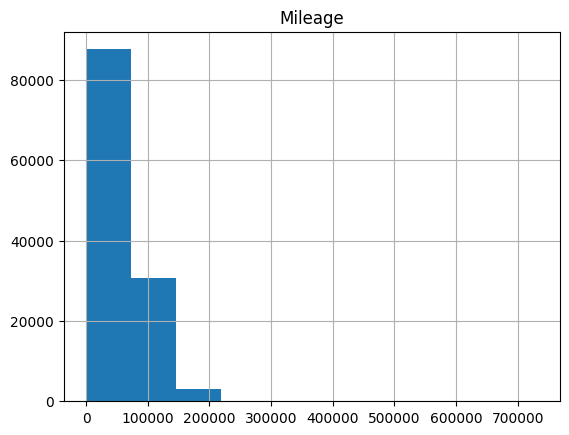

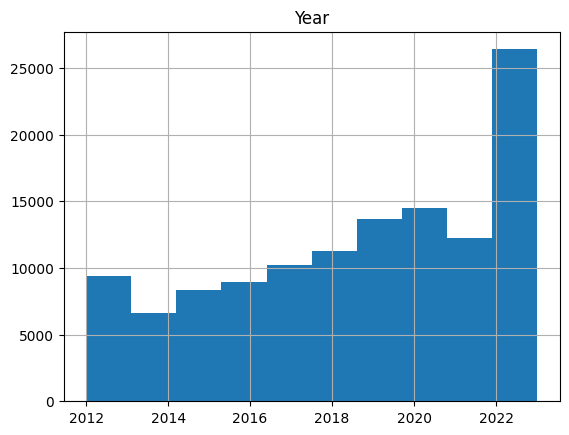

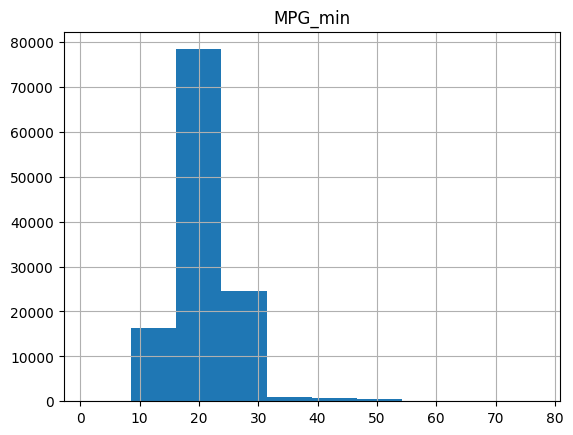

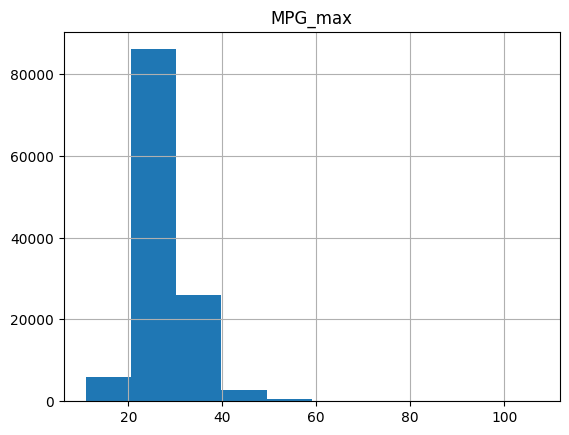

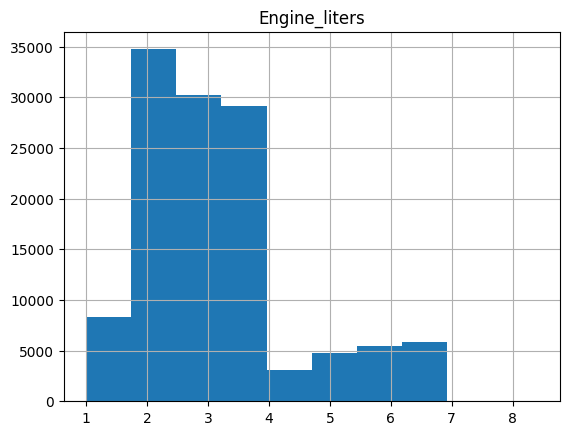

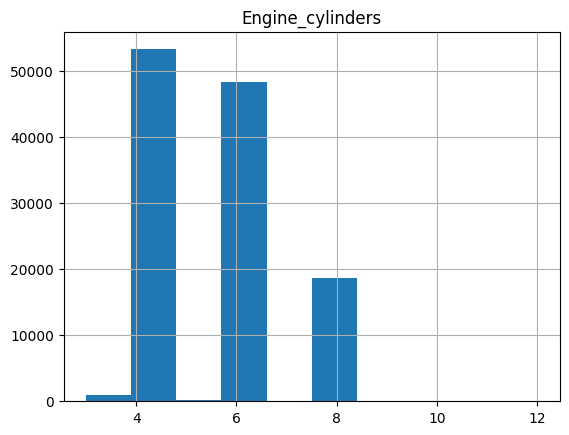

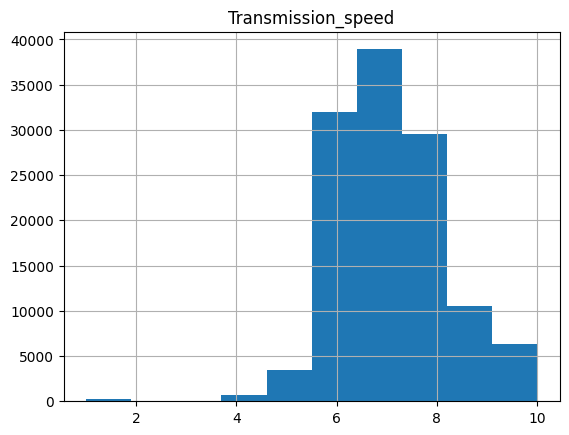

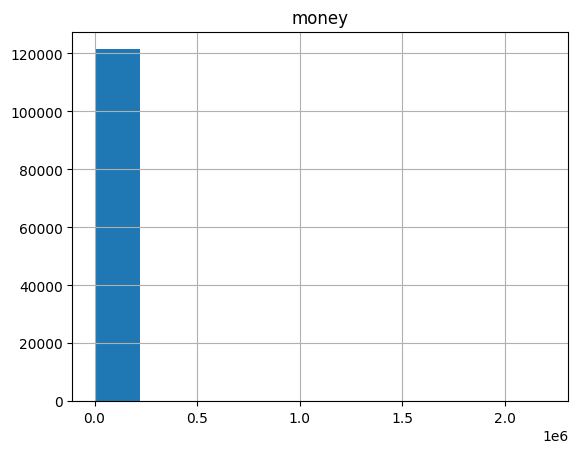

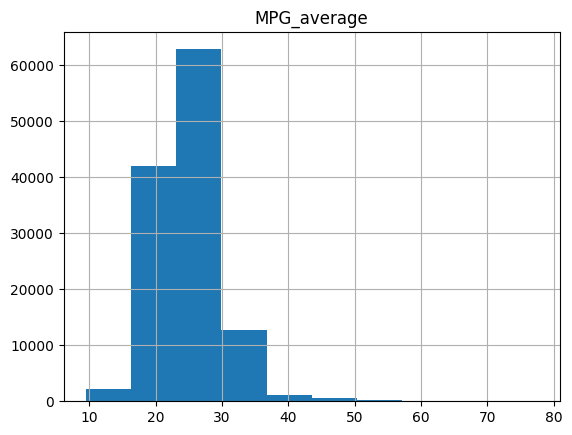

In [ ]:
for c in numeric_columns:
    data[[c]].hist()

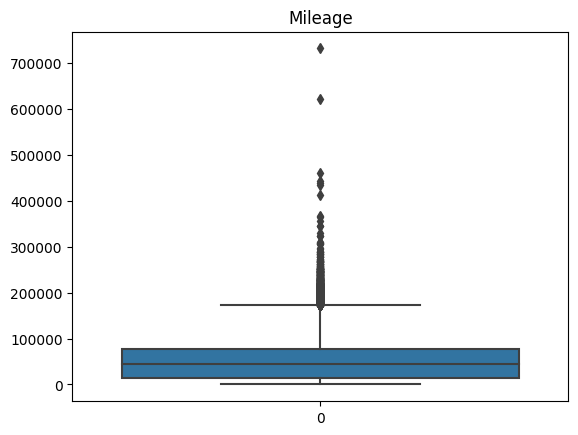

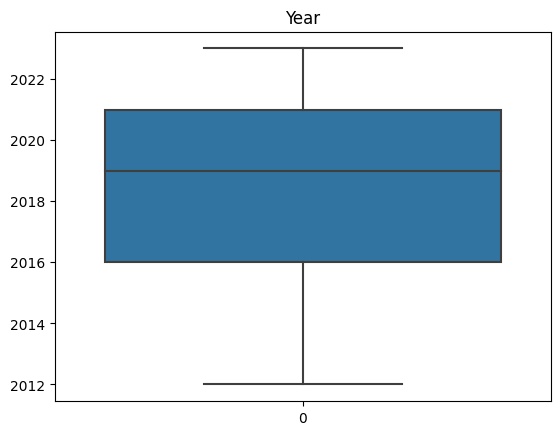

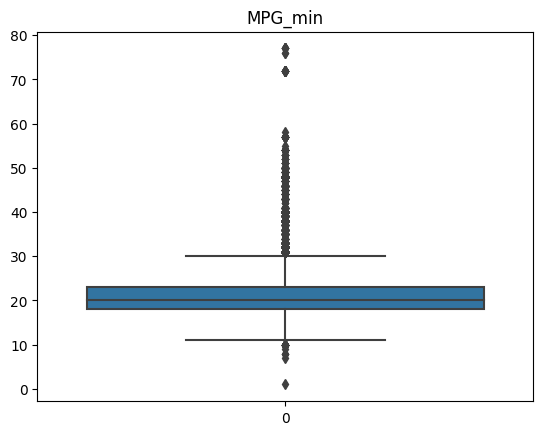

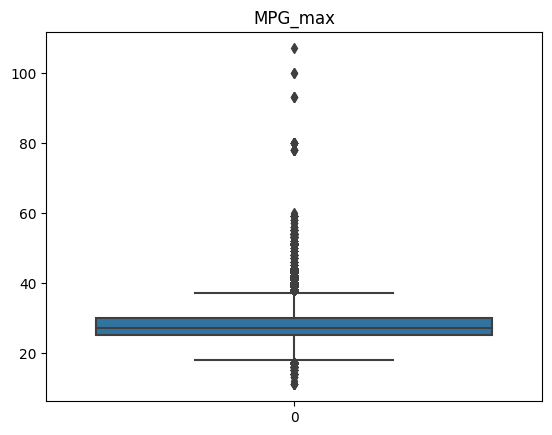

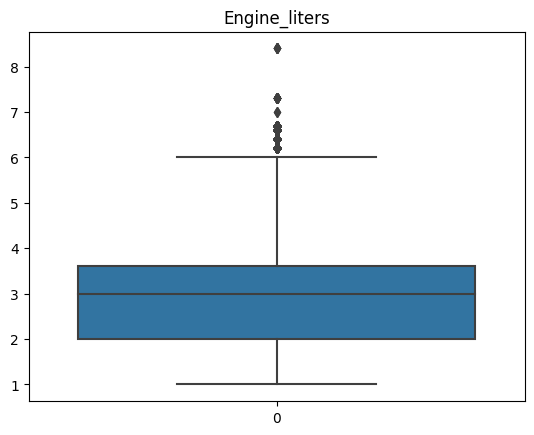

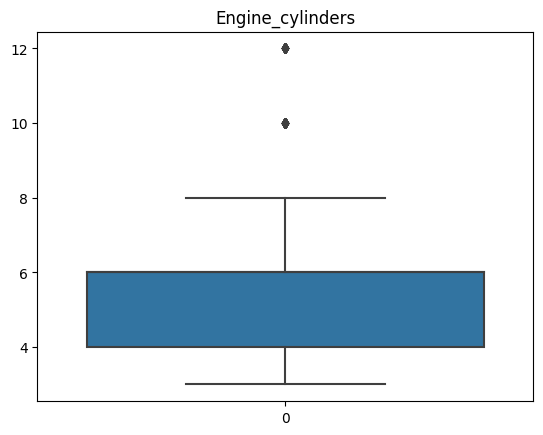

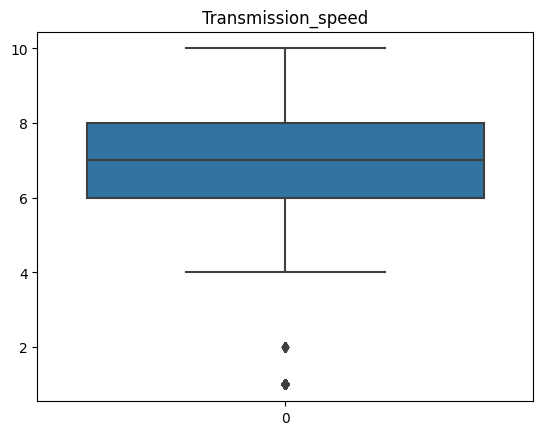

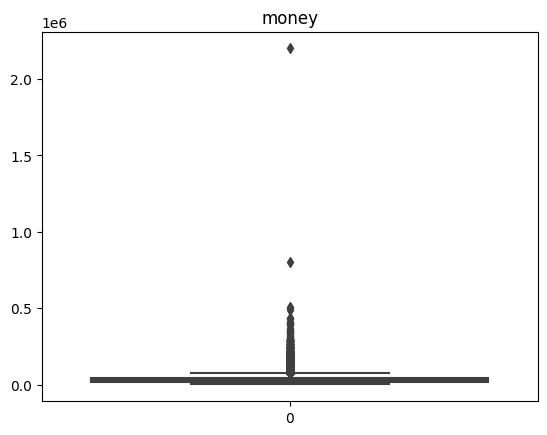

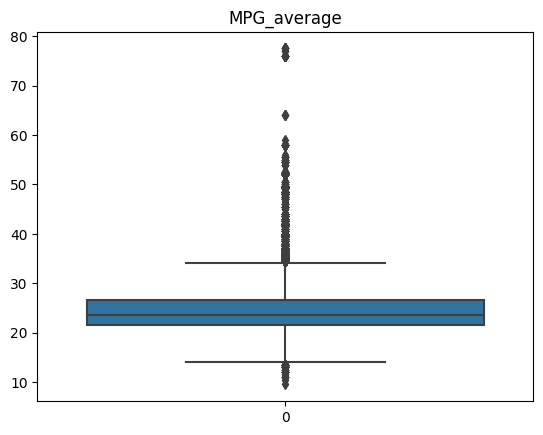

In [ ]:
for c in numeric_columns:
    sns.boxplot(data[c])
    plt.title(c)
    plt.show()

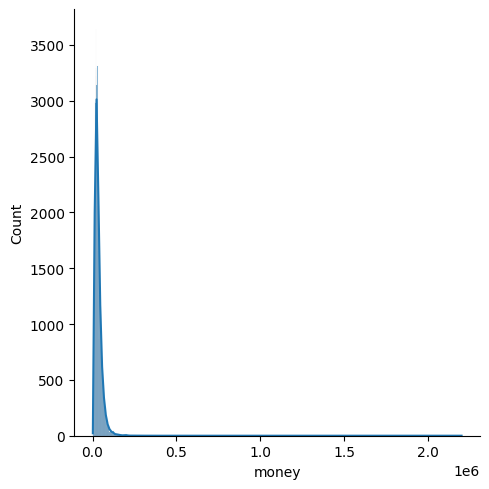

In [ ]:
sns.displot(data, x='money', kde=True)
plt.show()

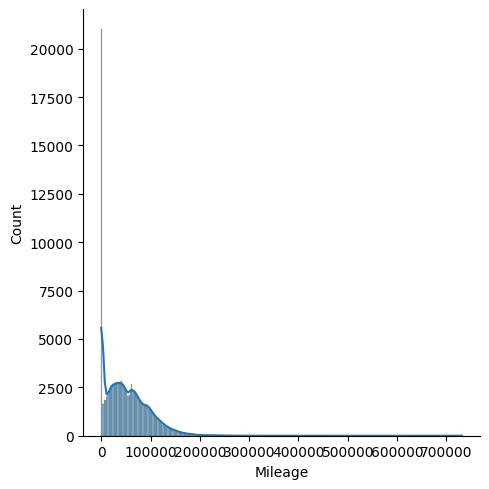

In [ ]:
sns.displot(data, x='Mileage', kde=True)
plt.show()

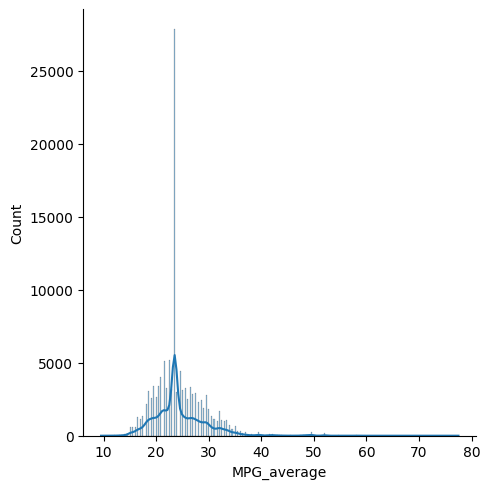

In [ ]:
sns.displot(data, x='MPG_average', kde=True)
plt.show()

## Correlations between some variables

There is an inverse relationship between money and mileage (obviously), furthermore, newer cars have less mileage and cost more (obviously)

In [ ]:
fig = px.scatter(data, x='money', y='Mileage', color='Year')
fig.show()

Direct relationship between cylinders and liters

In [ ]:
fig = px.scatter(data, x='Engine_cylinders', y='Engine_liters')
fig.show()

Inverse relationship between miles per gallon and engine liters

In [ ]:
fig = px.scatter(data, x='MPG_average', y='Engine_liters')
fig.show()

On average cars with no accidents or damages cost core (obviously)

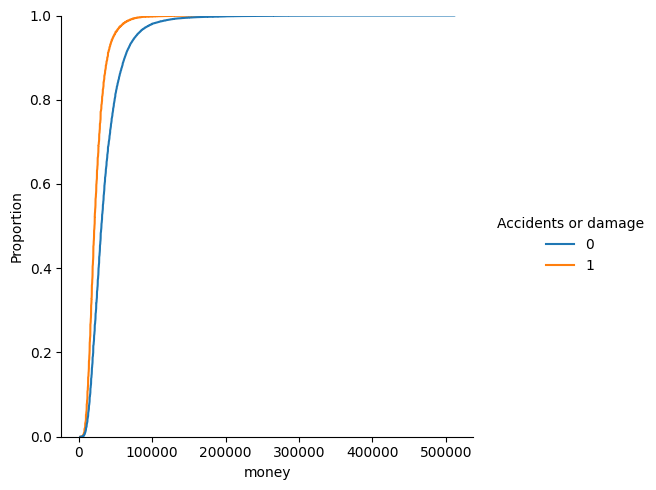

In [ ]:
sns.displot(data[data['money'] < 700000], x='money', hue='Accidents or damage', kind='ecdf')
plt.show()

Relationships between numerical features and the target feature

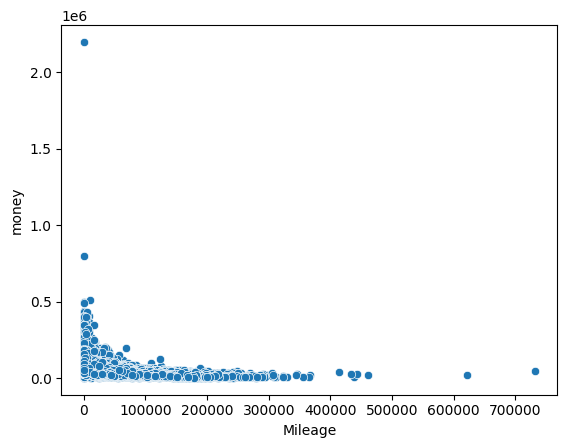

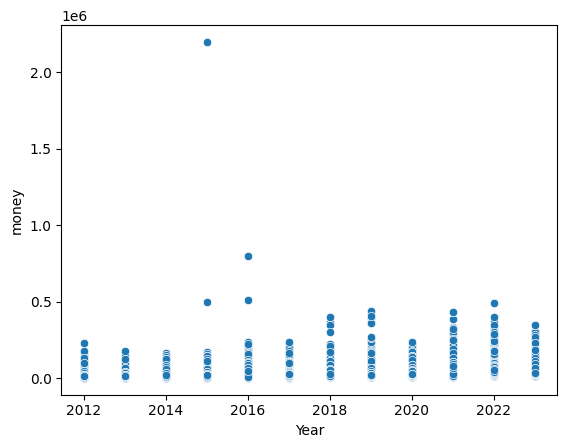

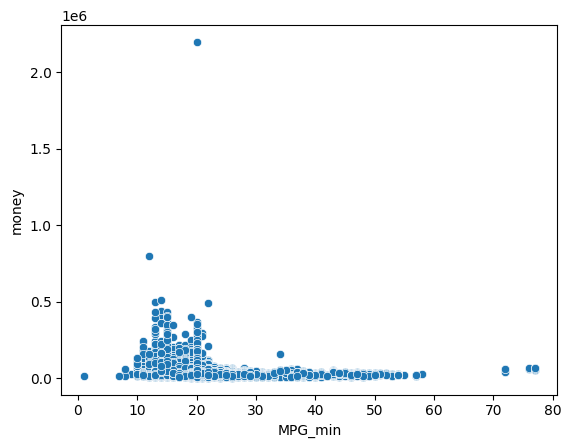

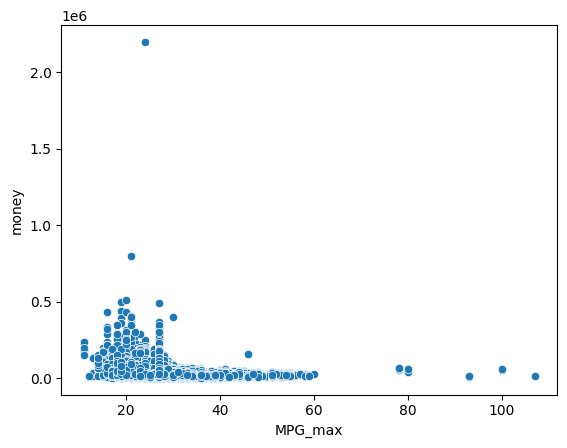

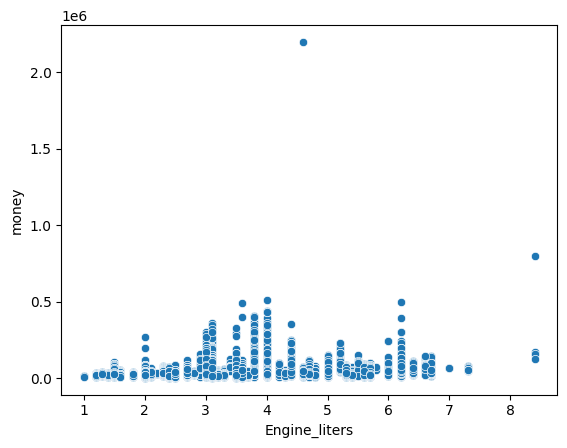

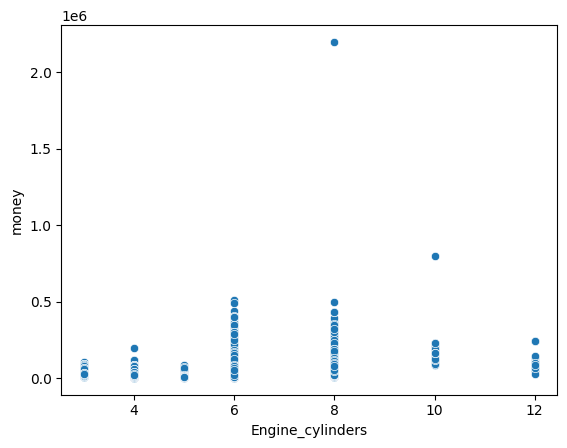

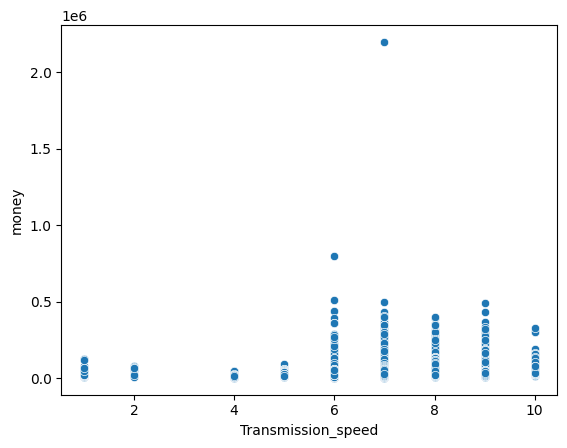

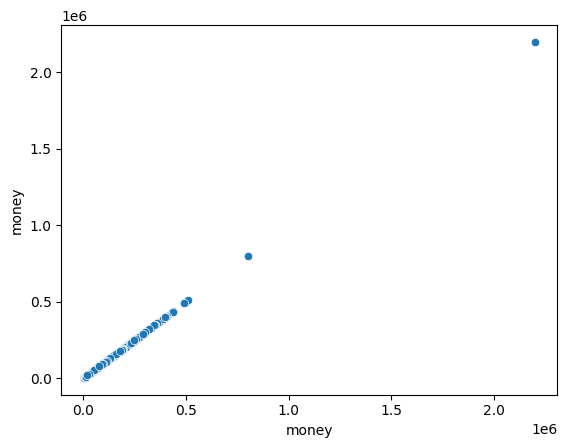

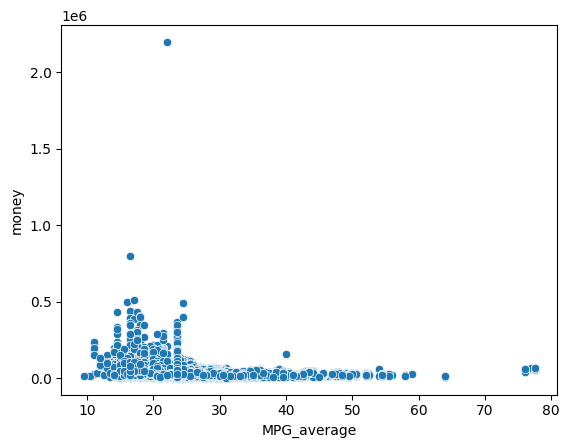

In [ ]:
for c in numeric_columns:
    sns.scatterplot(data, x=c, y='money')
    plt.show()

## Relationship between categorical features

we drop Stability Control.1 since it is a duplicate column (for some reason)

In [ ]:
data.drop('safety_Stability Control.1', axis=1, inplace=True)
X_test.drop('safety_Stability Control.1', axis=1, inplace=True)

In [ ]:
def make_categorical_plot(features_list, replace_string, feature_name):
    features_list = [c for c in data.columns.tolist() if c.startswith(replace_string)]
    # find the mean values of cars with and without a feature (safety, convenience, etc...)
    feature_yes = []
    feature_no = []
    for c in features_list:
        feature_yes.append(np.mean(data[data[c] == 1]['money']))
        feature_no.append(np.mean(data[data[c] == 0]['money']))

    total_yes = np.mean(feature_yes)
    feature_yes.append(total_yes)
    total_no = np.mean(feature_no)
    feature_no.append(total_no)
    features_list.append('Total')

    # position of the bars
    br1 = np.arange(len(features_list))
    br2 = [x + 0.25 for x in br1]

    features_list = [c.replace(replace_string, '') for c in features_list]
    plt.barh(br1, feature_yes, color='tab:blue', height=0.25, label=feature_name)
    plt.yticks([r + 0.25 for r in range(len(features_list))], features_list)
    if feature_name != 'brand' and feature_name != 'new&used':
        plt.barh(br2, feature_no, color='tab:orange', height=0.25, label='no {}'.format(feature_name))
        plt.legend(bbox_to_anchor=(1, 1))
    plt.title(feature_name)
    plt.show()

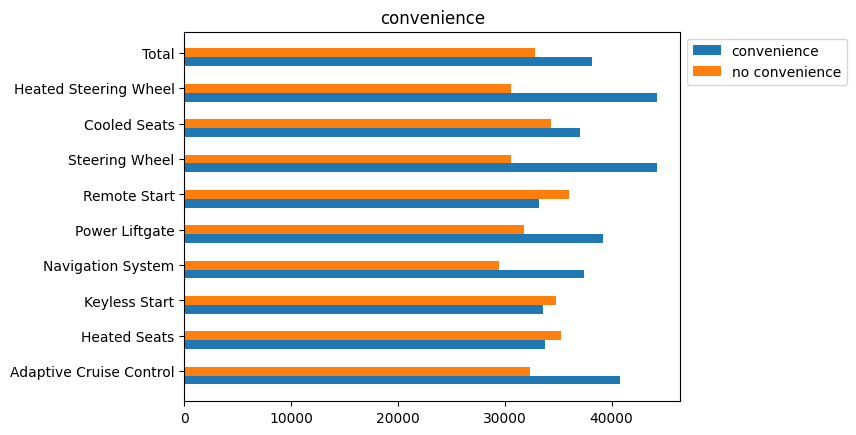

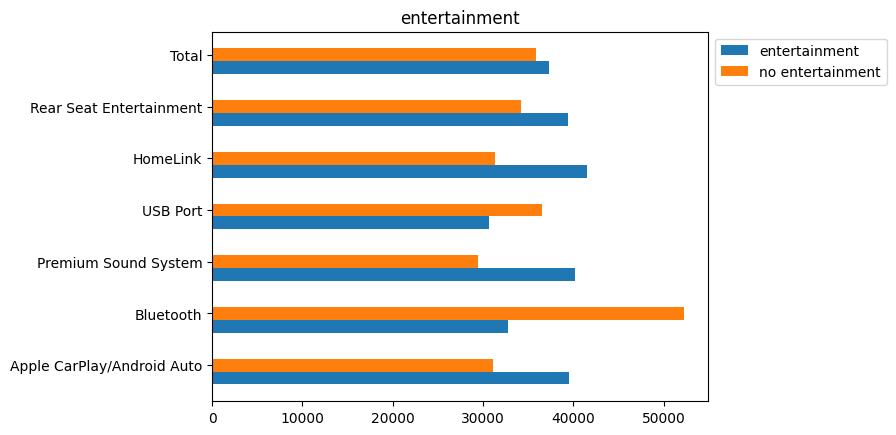

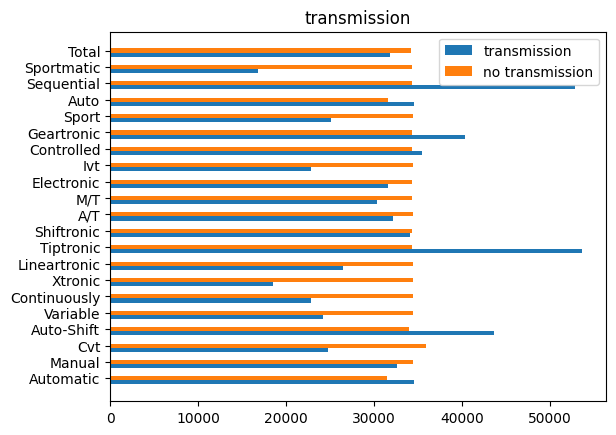

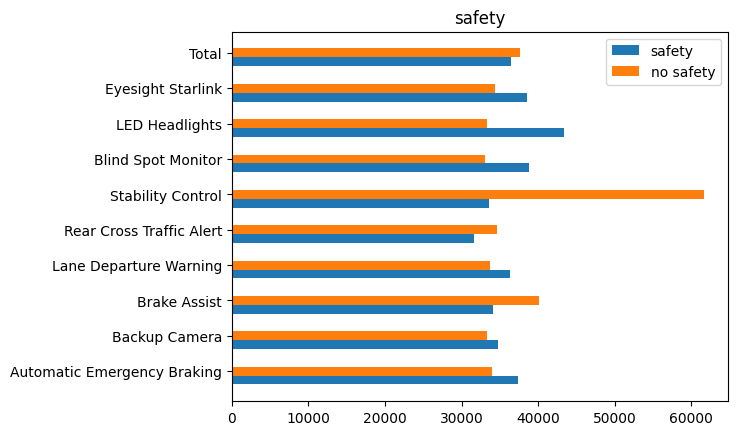

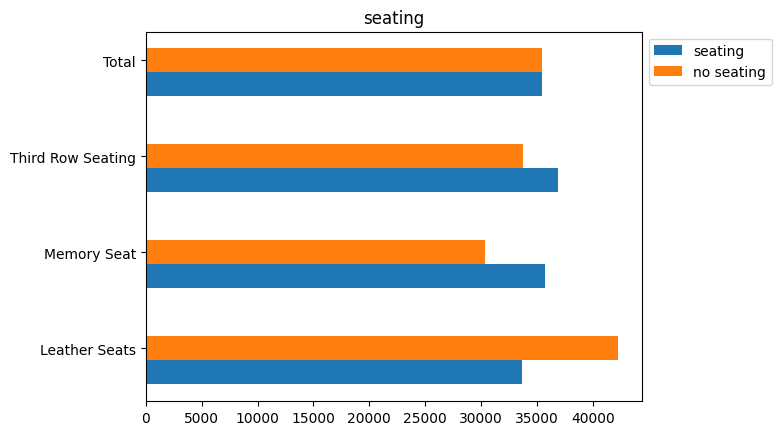

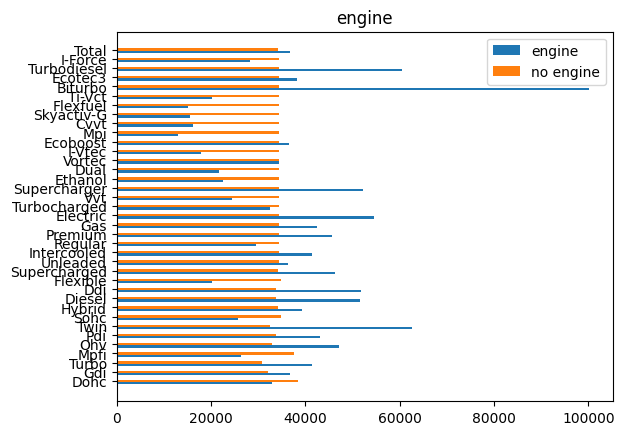

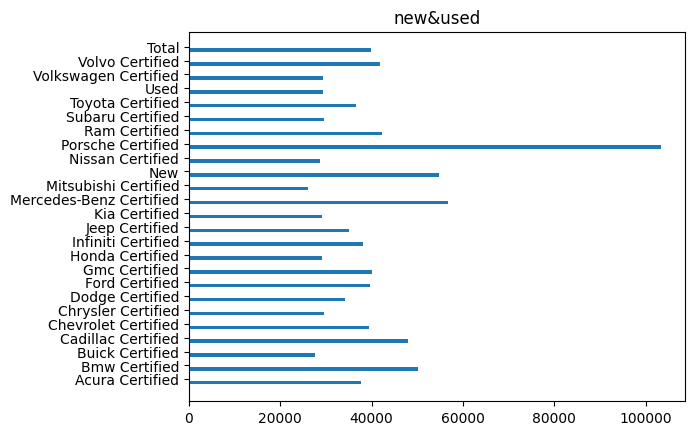

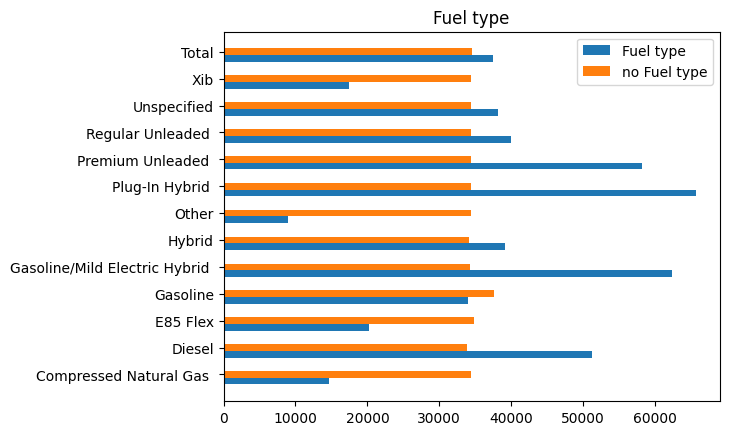

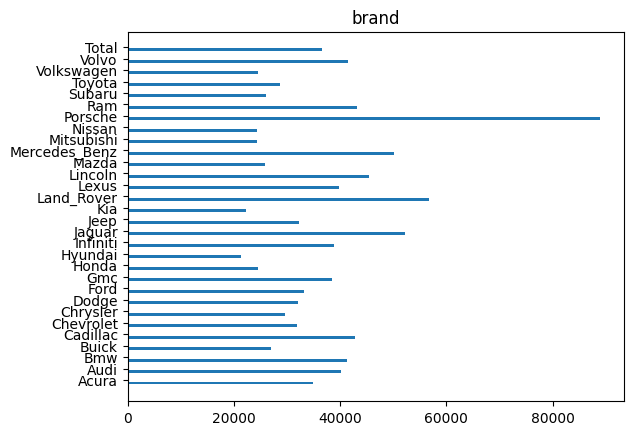

In [ ]:
convenience_features = [c for c in data.columns if c.startswith('convenience_')]
make_categorical_plot(convenience_features, 'convenience_', 'convenience')

entertainment_features = [c for c in data.columns if c.startswith('entertainment_')]
make_categorical_plot(entertainment_features, 'entertainment_', 'entertainment')

transmission_features = [c for c in data.columns if c.startswith('transmission_')]
make_categorical_plot(transmission_features, 'transmission_', 'transmission')

safety_features = [c for c in data.columns if c.startswith('safety_')]
make_categorical_plot(safety_features, 'safety_', 'safety')

seating_features = [c for c in data.columns if c.startswith('seating_')]
make_categorical_plot(seating_features, 'seating_', 'seating')

engine_features = [c for c in data.columns if c.startswith('engine_')]
make_categorical_plot(engine_features, 'engine_', 'engine')

newused_features = [c for c in data.columns if c.startswith('new&used_')]
make_categorical_plot(newused_features, 'new&used_', 'new&used')

FuelType_features = [c for c in data.columns if c.startswith('Fuel type_')]
make_categorical_plot(FuelType_features, 'Fuel type_', 'Fuel type')

brand_features = [c for c in data.columns if c.startswith('brand_')]
make_categorical_plot(brand_features, 'brand_', 'brand')

We check for some data

Cars with no Bluetooth tend to cost more:
1.   they are newer (newer cars have newer technology)
2.   they have a lower mileage (since they are newer)

A p-value of 0 confirms that the difference is significative



In [ ]:
print('No Bluetooth')
print(data[data['entertainment_Bluetooth'] == 0][numeric_columns].mean())
print('------------------')
print('Bluetooth')
print(data[data['entertainment_Bluetooth'] == 1][numeric_columns].mean())

# test to check if the difference is due to chance
price_no_bluetooth = data[data['entertainment_Bluetooth'] == 0]['money']
price_bluetooth = data[data['entertainment_Bluetooth'] == 1]['money']
print('------------------')
print('t-test results')
print(stats.ttest_ind(price_no_bluetooth, price_bluetooth))

No Bluetooth
Mileage               15921.211235
Year                   2021.607320
MPG_min                  20.031847
MPG_max                  27.027500
Engine_liters             3.222293
Engine_cylinders          5.459610
Transmission_speed        7.293802
money                 52323.035285
MPG_average              23.529673
dtype: float64
------------------
Bluetooth
Mileage               53970.391896
Year                   2018.295533
MPG_min                  20.948970
MPG_max                  28.053599
Engine_liters             3.123521
Engine_cylinders          5.403984
Transmission_speed        7.218523
money                 32759.106876
MPG_average              24.501285
dtype: float64
------------------
t-test results
Ttest_indResult(statistic=80.34756525919481, pvalue=0.0)


Cars with no sequential transmission tend to cost more for the same reason of Bluetooth.

In [ ]:
print('No sequential transmission')
print(data[data['transmission_Sequential'] == 0][numeric_columns].mean())
print('------------------')
print('Sequential transmission')
print(data[data['transmission_Sequential'] == 1][numeric_columns].mean())

# test to check if the difference is due to chance
price_no_sequential = data[data['transmission_Sequential'] == 0]['money']
price_sequential = data[data['transmission_Sequential'] == 1]['money']
print('------------------')
print('t-test results')
print(stats.ttest_ind(price_no_sequential, price_sequential))

No sequential transmission
Mileage               50883.554092
Year                   2018.564194
MPG_min                  20.875050
MPG_max                  27.971097
Engine_liters             3.131179
Engine_cylinders          5.407693
Transmission_speed        7.225110
money                 34343.571533
MPG_average              24.423074
dtype: float64
------------------
Sequential transmission
Mileage               28867.239130
Year                   2020.521739
MPG_min                  19.065217
MPG_max                  25.413043
Engine_liters             4.128261
Engine_cylinders          7.565217
Transmission_speed        6.000000
money                 52825.608696
MPG_average              22.239130
dtype: float64
------------------
t-test results
Ttest_indResult(statistic=-5.262389755164953, pvalue=1.424352761152565e-07)


Cars with Stability Control tend to cost less since there are more cheaper cars that lower the average price

In [ ]:
print('No stability control')
print(data[data['safety_Stability Control'] == 0][brand_features].sum().sort_values())
print('------------------')
print('Stability control')
print(data[data['safety_Stability Control'] == 1][brand_features].sum().sort_values())

No stability control
brand_Acura              4
brand_Mitsubishi         6
brand_Honda             13
brand_Jaguar            16
brand_Kia               30
brand_Hyundai           38
brand_Toyota            42
brand_Land_Rover        44
brand_Mazda             50
brand_Nissan            80
brand_Volkswagen        87
brand_Infiniti          95
brand_Lincoln           96
brand_Volvo             97
brand_Audi             112
brand_Jeep             116
brand_Porsche          117
brand_Mercedes_Benz    120
brand_Lexus            132
brand_Buick            136
brand_Ford             145
brand_Subaru           147
brand_Dodge            148
brand_Chevrolet        166
brand_Chrysler         187
brand_Bmw              200
brand_Cadillac         202
brand_Gmc              209
brand_Ram              290
dtype: int64
------------------
Stability control
brand_Jaguar            934
brand_Porsche          1604
brand_Mitsubishi       1753
brand_Volvo            2006
brand_Acura            2535
brand_

Cars with leather seats tend to cost less:
1.    they are used
2.    they have more mileage

In [ ]:
print('No leather seats')
print(data[data['seating_Leather Seats'] == 0][newused_features].sum().sort_values())
print('------------------')
print('Leather seats')
print(data[data['seating_Leather Seats'] == 1][newused_features].sum().sort_values())

print('------------------------------------')

print('No leather seats')
print(data[data['seating_Leather Seats'] == 0][numeric_columns].mean())
print('------------------')
print('Leather seats')
print(data[data['seating_Leather Seats'] == 1][numeric_columns].mean())

No leather seats
new&used_Mitsubishi Certified          0
new&used_Acura Certified               3
new&used_Infiniti Certified            7
new&used_Jeep Certified                9
new&used_Buick Certified               9
new&used_Subaru Certified             10
new&used_Ram Certified                10
new&used_Kia Certified                13
new&used_Bmw Certified                15
new&used_Nissan Certified             17
new&used_Volkswagen Certified         17
new&used_Honda Certified              19
new&used_Chevrolet Certified          22
new&used_Cadillac Certified           22
new&used_Volvo Certified              33
new&used_Toyota Certified             36
new&used_Mercedes-Benz Certified      36
new&used_Ford Certified               39
new&used_Gmc Certified                48
new&used_Chrysler Certified           63
new&used_Dodge Certified              71
new&used_Porsche Certified            88
new&used_New                        3941
new&used_Used                       5338

Cars with Biturbo tend to cost more, the difference is significative but they are a small sample of 8 Mercedes. Biturbo could influence the price, we need more analysis.

In [ ]:
print('No Biturbo')
print(data[data['engine_Biturbo'] == 0][brand_features].sum().sort_values())
print('------------------')
print('Biturbo')
print(data[data['engine_Biturbo'] == 1][brand_features].sum().sort_values())
print('------------------')

# we do more tests considering only mercedes
print(data[(data['engine_Biturbo'] == 1) & (data['brand_Mercedes_Benz'] == 1)][numeric_columns].mean())
print(data[(data['engine_Biturbo'] == 0) & (data['brand_Mercedes_Benz'] == 1)][numeric_columns].mean())

for c in numeric_columns:
    unleaded = data[(data['engine_Biturbo'] == 1) & (data['brand_Mercedes_Benz'] == 1)][c]
    no_unleaded = data[(data['engine_Biturbo'] == 0) & (data['brand_Mercedes_Benz'] == 1)][c]
    print('------------------')
    print('t-test results for feature {}'.format(c))
    print(stats.ttest_ind(unleaded, no_unleaded, permutations=2000))

No Biturbo
brand_Jaguar            950
brand_Porsche          1721
brand_Mitsubishi       1759
brand_Volvo            2103
brand_Acura            2539
brand_Land_Rover       2728
brand_Lincoln          2859
brand_Infiniti         2922
brand_Chrysler         3382
brand_Cadillac         3486
brand_Mazda            3511
brand_Buick            3703
brand_Lexus            3816
brand_Volkswagen       4014
brand_Audi             4395
brand_Subaru           4433
brand_Kia              4810
brand_Ram              4985
brand_Dodge            4997
brand_Mercedes_Benz    5208
brand_Hyundai          5299
brand_Gmc              5368
brand_Nissan           5517
brand_Bmw              5565
brand_Toyota           6074
brand_Jeep             6120
brand_Honda            6322
brand_Chevrolet        6433
brand_Ford             6564
dtype: int64
------------------
Biturbo
brand_Acura            0
brand_Toyota           0
brand_Subaru           0
brand_Ram              0
brand_Porsche          0
brand_Nissan

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:6919: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



Ttest_indResult(statistic=3.1531828085673066, pvalue=0.0024987506246876563)
------------------
t-test results for feature Engine_cylinders
Ttest_indResult(statistic=3.8601170846917854, pvalue=0.0009995002498750624)
------------------
t-test results for feature Transmission_speed


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:6986: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



Ttest_indResult(statistic=-2.4508920681781485, pvalue=0.025987006496751622)
------------------
t-test results for feature money
Ttest_indResult(statistic=3.546629977898142, pvalue=0.005497251374312844)
------------------
t-test results for feature MPG_average
Ttest_indResult(statistic=-3.720936842015208, pvalue=0.0009995002498750624)


Hybrid, Diesel and Premium Unleaded cars tend to cost more

In [ ]:
print('Hybrid')
print(data[(data['Fuel type_Plug-In Hybrid '] == 1) | (data['Fuel type_Hybrid'] == 1)
| (data['Fuel type_Gasoline/Mild Electric Hybrid '] == 1)][newused_features].sum().sort_values())
print('------------------')
print('No Hybrid')
print(data[(data['Fuel type_Plug-In Hybrid '] == 0) & (data['Fuel type_Hybrid'] == 0)
& (data['Fuel type_Gasoline/Mild Electric Hybrid '] == 0)][newused_features].sum().sort_values())

hybrid = data[(data['Fuel type_Plug-In Hybrid '] == 1) | (data['Fuel type_Hybrid'] == 1)
| (data['Fuel type_Gasoline/Mild Electric Hybrid '] == 1)]['money']
no_hybrid = data[(data['Fuel type_Plug-In Hybrid '] == 0) & (data['Fuel type_Hybrid'] == 0)
& (data['Fuel type_Gasoline/Mild Electric Hybrid '] == 0)]['money']
print('------------------')
print('t-test results')
print(stats.ttest_ind(hybrid, no_hybrid))

Hybrid
new&used_Cadillac Certified            0
new&used_Chevrolet Certified           0
new&used_Chrysler Certified            0
new&used_Dodge Certified               0
new&used_Gmc Certified                 0
new&used_Infiniti Certified            0
new&used_Volkswagen Certified          0
new&used_Mitsubishi Certified          0
new&used_Nissan Certified              1
new&used_Acura Certified               2
new&used_Subaru Certified              2
new&used_Buick Certified               2
new&used_Ram Certified                 2
new&used_Ford Certified                4
new&used_Mercedes-Benz Certified       4
new&used_Jeep Certified                9
new&used_Porsche Certified            14
new&used_Kia Certified                18
new&used_Bmw Certified                18
new&used_Honda Certified              33
new&used_Volvo Certified              34
new&used_Toyota Certified             90
new&used_New                        1494
new&used_Used                       2938
dtype: in

Premium Unleaded Fuel could influence the price

In [ ]:
print('Unleaded')
print(data[data['Fuel type_Premium Unleaded '] == 1][brand_features].sum().sort_values())
print('------------------')
print('No Unleaded')
print(data[data['Fuel type_Premium Unleaded '] == 0][brand_features].sum().sort_values())

# we do more tests considering only volvo
print(data[(data['Fuel type_Premium Unleaded '] == 1) & (data['brand_Volvo'] == 1)][numeric_columns].mean())
print(data[(data['Fuel type_Premium Unleaded '] == 0) & (data['brand_Volvo'] == 1)][numeric_columns].mean())

for c in numeric_columns:
    unleaded = data[(data['Fuel type_Premium Unleaded '] == 1) & (data['brand_Volvo'] == 1)][c]
    no_unleaded = data[(data['Fuel type_Premium Unleaded '] == 0) & (data['brand_Volvo'] == 1)][c]
    print('------------------')
    print('t-test results for feature {}'.format(c))
    print(stats.ttest_ind(unleaded, no_unleaded, permutations=2000))

Unleaded
brand_Acura            0
brand_Toyota           0
brand_Subaru           0
brand_Ram              0
brand_Porsche          0
brand_Nissan           0
brand_Mitsubishi       0
brand_Mercedes_Benz    0
brand_Mazda            0
brand_Lincoln          0
brand_Lexus            0
brand_Land_Rover       0
brand_Kia              0
brand_Volkswagen       0
brand_Jeep             0
brand_Infiniti         0
brand_Hyundai          0
brand_Honda            0
brand_Gmc              0
brand_Ford             0
brand_Dodge            0
brand_Chrysler         0
brand_Chevrolet        0
brand_Cadillac         0
brand_Buick            0
brand_Bmw              0
brand_Audi             0
brand_Jaguar           0
brand_Volvo            5
dtype: int64
------------------
No Unleaded
brand_Jaguar            950
brand_Porsche          1721
brand_Mitsubishi       1759
brand_Volvo            2098
brand_Acura            2539
brand_Land_Rover       2728
brand_Lincoln          2859
brand_Infiniti         292

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:6919: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



Ttest_indResult(statistic=1.3336072933773953, pvalue=0.20189905047476261)
------------------
t-test results for feature MPG_min


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:6986: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



Ttest_indResult(statistic=-0.7791512187233188, pvalue=0.40879560219890054)
------------------
t-test results for feature MPG_max
Ttest_indResult(statistic=-1.0522742463390264, pvalue=0.32083958020989506)
------------------
t-test results for feature Engine_liters
Ttest_indResult(statistic=6.031443007419683, pvalue=0.0004997501249375312)
------------------
t-test results for feature Engine_cylinders
Ttest_indResult(statistic=-0.690089315937349, pvalue=0.7301349325337332)
------------------
t-test results for feature Transmission_speed
Ttest_indResult(statistic=-1.36826595182144, pvalue=0.2753623188405797)
------------------
t-test results for feature money
Ttest_indResult(statistic=2.3610064448276677, pvalue=0.02048975512243878)
------------------
t-test results for feature MPG_average
Ttest_indResult(statistic=-0.9835236219778196, pvalue=0.3548225887056472)


Mmmmmh more analysis

In [ ]:
print('Diesel')
print(data[data['Fuel type_Diesel'] == 1][numeric_columns].mean())
print('------------------')
print('No Diesel')
print(data[data['Fuel type_Diesel'] == 0][numeric_columns].mean())

for c in numeric_columns:
    diesel = data[data['Fuel type_Diesel'] == 1][c]
    no_diesel = data[data['Fuel type_Diesel'] == 0][c]
    print('------------------')
    print('t-test results for feature {}'.format(c))
    print(stats.ttest_ind(diesel, no_diesel))

Diesel
Mileage               61369.200467
Year                   2018.396873
MPG_min                  20.376577
MPG_max                  27.452276
Engine_liters             5.132392
Engine_cylinders          6.428140
Transmission_speed        7.040592
money                 51198.278936
MPG_average              23.914427
dtype: float64
------------------
No Diesel
Mileage               50550.827676
Year                   2018.570130
MPG_min                  20.889754
MPG_max                  27.986138
Engine_liters             3.069705
Engine_cylinders          5.376989
Transmission_speed        7.230336
money                 33829.755013
MPG_average              24.437946
dtype: float64
------------------
t-test results for feature Mileage
Ttest_indResult(statistic=14.958483884176616, pvalue=1.5210156922046834e-50)
------------------
t-test results for feature Year
Ttest_indResult(statistic=-3.287711680171594, pvalue=0.0010103386379494562)
------------------
t-test results for feature 

Brand will surely influence the price

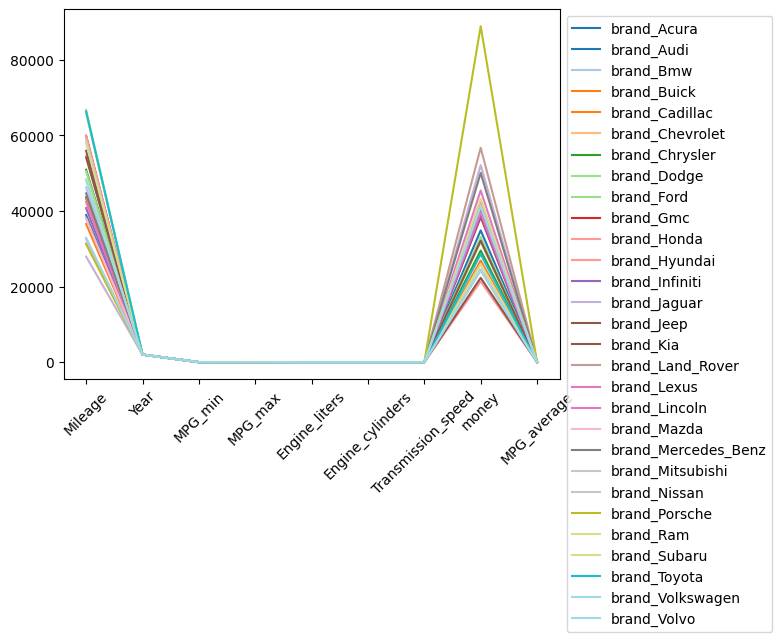

In [ ]:
values = []
for brand in brand_features:
    values.append(data[data[brand] == 1][numeric_columns].mean())

values = pd.concat(values, axis=1)
values.columns = brand_features
values.plot.line(rot=45, legend=False, cmap='tab20')
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

## Study of correlation

We study the correlation in general and we try to understand is some feature are really correlated with other as we saw previously

In [ ]:
corr_mat = data.corr()

Probably older cars have Bluetooth (high positive correlation with Used, Mileage and high negative correlation with New, Year). Newer cars have other technologies such as CarPlay/Android Auto.

In [ ]:
# positive and negative correlation
pos = corr_mat['entertainment_Bluetooth'].sort_values()[0:10]
neg = corr_mat['entertainment_Bluetooth'].sort_values()[-11:-1]
pd.concat([pos, neg])

new&used_New                               -0.454403
Year                                       -0.288867
money                                      -0.224539
entertainment_Apple CarPlay/Android Auto   -0.123134
convenience_Heated Seats                   -0.100498
transmission_Shiftronic                    -0.099857
engine_Hybrid                              -0.070152
entertainment_HomeLink                     -0.067534
Fuel type_Hybrid                           -0.066490
convenience_Heated Steering Wheel          -0.066206
safety_Lane Departure Warning               0.089132
Accidents or damage                         0.104549
entertainment_USB Port                      0.107353
safety_Stability Control                    0.122779
exterior_Alloy Wheels                       0.136065
convenience_Remote Start                    0.155283
convenience_Keyless Start                   0.170006
Mileage                                     0.241615
seating_Leather Seats                       0.

For the sequential transmission there is no a high positive/negative correlation with features

In [ ]:
pos = corr_mat['transmission_Sequential'].sort_values()[0:10]
neg = corr_mat['transmission_Sequential'].sort_values()[-11:-1]
pd.concat([pos, neg])

entertainment_Bluetooth     -0.040623
seating_Leather Seats       -0.034489
convenience_Remote Start    -0.020731
engine_Gdi                  -0.019778
Transmission_speed          -0.019428
new&used_Used               -0.015769
engine_Turbo                -0.013895
exterior_Alloy Wheels       -0.011735
Mileage                     -0.009945
MPG_max                     -0.009387
Year                         0.012146
money                        0.015090
Engine_liters                0.015248
engine_Mpfi                  0.018470
exterior_Sunroof/Moonroof    0.019692
new&used_New                 0.020767
Engine_cylinders             0.028890
entertainment_HomeLink       0.029039
seating_Third Row Seating    0.030363
brand_Lexus                  0.103226
Name: transmission_Sequential, dtype: float64

Newer cars have no stability control but there are other technologies

In [ ]:
pos = corr_mat['safety_Stability Control'].sort_values()[0:10]
neg = corr_mat['safety_Stability Control'].sort_values()[-11:-1]
pd.concat([pos, neg])

new&used_New                               -0.271148
money                                      -0.186280
Year                                       -0.182773
safety_LED Headlights                      -0.117218
new&used_Porsche Certified                 -0.084809
Engine_liters                              -0.060441
Engine_cylinders                           -0.059064
engine_Ohv                                 -0.055455
engine_Ddi                                 -0.049976
engine_Diesel                              -0.049482
entertainment_Apple CarPlay/Android Auto    0.037304
seating_Leather Seats                       0.049572
Accidents or damage                         0.064925
entertainment_USB Port                      0.093815
safety_Backup Camera                        0.097605
entertainment_Bluetooth                     0.122779
exterior_Alloy Wheels                       0.132562
Mileage                                     0.157324
new&used_Used                               0.

Same

In [ ]:
pos = corr_mat['seating_Leather Seats'].sort_values()[0:10]
neg = corr_mat['seating_Leather Seats'].sort_values()[-11:-1]
pd.concat([pos, neg])

seating_Third Row Seating            -0.327406
new&used_New                         -0.185160
Year                                 -0.131475
brand_Dodge                          -0.107505
money                                -0.098506
brand_Chrysler                       -0.097367
brand_Lincoln                        -0.069178
Transmission_speed                   -0.053414
Engine_cylinders                     -0.051407
convenience_Power Liftgate           -0.047851
convenience_Remote Start              0.081638
Mileage                               0.084158
MPG_min                               0.085941
exterior_Alloy Wheels                 0.088637
MPG_max                               0.089513
MPG_average                           0.089578
entertainment_Premium Sound System    0.094183
seating_Memory Seat                   0.163423
new&used_Used                         0.165382
entertainment_Bluetooth               0.244651
Name: seating_Leather Seats, dtype: float64

Biturbo is positively correlated with the price (actually the price is correlated with biturbo)

In [ ]:
pos = corr_mat['engine_Biturbo'].sort_values()[0:10]
neg = corr_mat['engine_Biturbo'].sort_values()[-11:-1]
pd.concat([pos, neg])

engine_Dohc                                -0.014031
MPG_max                                    -0.010095
MPG_average                                -0.009558
MPG_min                                    -0.008561
engine_Gdi                                 -0.008247
entertainment_USB Port                     -0.006248
engine_Turbo                               -0.005794
engine_Mpfi                                -0.005154
seating_Leather Seats                      -0.005016
entertainment_Apple CarPlay/Android Auto   -0.004305
convenience_Heated Seats                    0.006592
entertainment_Premium Sound System          0.006818
convenience_Keyless Start                   0.010463
exterior_Sunroof/Moonroof                   0.010780
entertainment_HomeLink                      0.012494
safety_Blind Spot Monitor                   0.012590
Engine_cylinders                            0.013078
safety_LED Headlights                       0.020957
money                                       0.

Quite obvious results

In [ ]:
pos = corr_mat['Fuel type_Plug-In Hybrid '].sort_values()[0:10]
neg = corr_mat['Fuel type_Plug-In Hybrid '].sort_values()[-11:-1]
pd.concat([pos, neg])

Fuel type_Gasoline          -0.021366
new&used_Used               -0.012995
seating_Leather Seats       -0.010776
entertainment_Bluetooth     -0.010758
safety_Brake Assist         -0.009484
exterior_Alloy Wheels       -0.008429
convenience_Remote Start    -0.008417
Mileage                     -0.008301
safety_Stability Control    -0.006258
entertainment_USB Port      -0.005411
entertainment_HomeLink       0.005693
engine_Turbo                 0.007360
brand_Volvo                  0.008049
money                        0.009249
exterior_Sunroof/Moonroof    0.009336
Year                         0.009941
new&used_New                 0.015687
brand_Bmw                    0.020871
engine_Electric              0.029847
engine_Hybrid                0.030980
Name: Fuel type_Plug-In Hybrid , dtype: float64

In [ ]:
pos = corr_mat['Fuel type_Premium Unleaded '].sort_values()[0:10]
neg = corr_mat['Fuel type_Premium Unleaded '].sort_values()[-11:-1]
pd.concat([pos, neg])

Fuel type_Gasoline                   -0.019504
transmission_Auto                    -0.018012
transmission_Automatic               -0.017844
entertainment_Bluetooth              -0.016858
safety_Stability Control             -0.015168
new&used_Used                        -0.011863
engine_Dohc                          -0.011092
safety_Brake Assist                  -0.010674
convenience_Remote Start             -0.007684
engine_Gdi                           -0.006519
entertainment_Premium Sound System    0.001849
safety_LED Headlights                 0.002138
safety_Rear Cross Traffic Alert       0.002259
convenience_Heated Seats              0.005211
Year                                  0.006210
money                                 0.006403
convenience_Steering Wheel            0.007492
convenience_Heated Steering Wheel     0.007492
brand_Volvo                           0.048338
new&used_Volvo Certified              0.108150
Name: Fuel type_Premium Unleaded , dtype: float64

In [ ]:
pos = corr_mat['Fuel type_Diesel'].sort_values()[0:10]
neg = corr_mat['Fuel type_Diesel'].sort_values()[-11:-1]
pd.concat([pos, neg])

Fuel type_Gasoline                    -0.534749
engine_Gdi                            -0.178744
exterior_Alloy Wheels                 -0.163241
engine_Dohc                           -0.156544
engine_Mpfi                           -0.111722
convenience_Power Liftgate            -0.093349
seating_Third Row Seating             -0.077061
transmission_Cvt                      -0.070782
convenience_Adaptive Cruise Control   -0.067544
entertainment_HomeLink                -0.061775
brand_Gmc                              0.103297
Engine_cylinders                       0.123442
money                                  0.124366
engine_Turbo                           0.234836
exterior_Tow Hitch                     0.235473
Engine_liters                          0.276646
engine_Ohv                             0.291007
brand_Ram                              0.295369
engine_Ddi                             0.973970
engine_Diesel                          0.983910
Name: Fuel type_Diesel, dtype: float64

Correlation with the target variable

<Axes: >

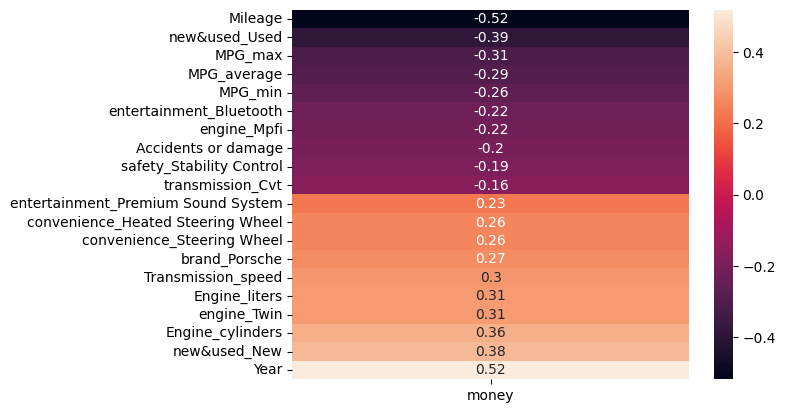

In [ ]:
pos = corr_mat['money'].sort_values()[0:10]
neg = corr_mat['money'].sort_values()[-11:-1]
money_corr = pd.concat([pos, neg])

sns.heatmap(pd.DataFrame(money_corr), annot=True)

## Save processed data

In [ ]:
X_train, y_train = data.drop('money', axis=1), data['money']
X_train.to_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_clean.csv', index=False)
X_test.to_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_clean.csv', index=False)
y_train.to_csv('/content/drive/MyDrive/datasets/New York Cars/y_train.csv', index=False)
y_test.to_csv('/content/drive/MyDrive/datasets/New York Cars/y_test.csv', index=False)

# Preprocessing

Load data

In [ ]:
X_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_clean.csv')
y_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_train.csv')
X_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_clean.csv')
y_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_test.csv')

## Standardize data to avoid big difference (year and mileage are very high and MPG, cylinders, liters and transmission speed are low)

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
numeric_columns = ['Mileage', 'Year', 'MPG_min', 'MPG_max', 'Engine_liters', 'Engine_cylinders', 'Transmission_speed']
scaler.fit(X_train[numeric_columns])
X_train[numeric_columns] = scaler.transform(X_train[numeric_columns])
X_test[numeric_columns] = scaler.transform(X_test[numeric_columns])

## Dimensionality Reduction

Two components to visualize data

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

print(pca.explained_variance_ratio_)
pca_df = pd.DataFrame(X_train_pca, columns=['PCA1', 'PCA2'])
pca_df['money'] = y_train

# since most cars are below 90k we select a subset to visualize better the two principal components
fig = px.scatter(pca_df[pca_df['money'] < 100000], x='PCA1', y='PCA2', color='money', opacity=0.4)
fig.show()

[0.69175985 0.06125906]


63 components are needed to express 99% of the variance.

Number of components: 63


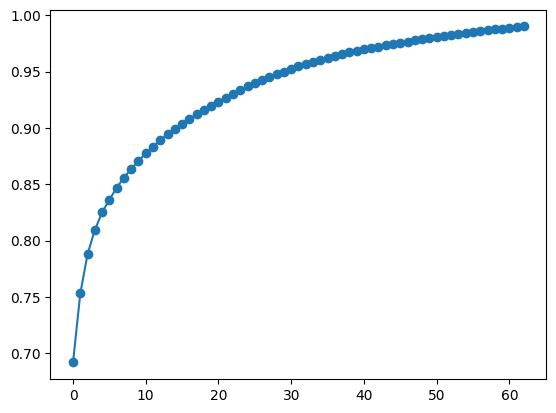

In [ ]:
pca = PCA(n_components=0.99)
pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

print('Number of components: {}'.format(pca.n_components_))
plt.plot(pca.explained_variance_ratio_.cumsum(), marker='o')

Correlation between original features and principal components. There are some features which do not contribute to the value of any principal component.

In [ ]:
components_df = pd.DataFrame(pca.components_.T, index=X_train.columns, columns=range(1, 64))

fig = px.imshow(components_df, labels=dict(x='Principal components', y='Features'))
fig.show()

We find some feature-principal component correlations

In [ ]:
# least influential features finding mean and std: low values of mean and std correspond to least influential features
components_df.T.describe().loc[['mean', 'std']].sort_values(by='std', axis=1)

,Fuel type_Hydrogen,Fuel type_Other,Fuel type_Regular Unleaded,safety_Eyesight Starlink,new&used_Mitsubishi Certified,engine_Turbodiesel,Fuel type_Unspecified,Fuel type_Plug-In Hybrid,engine_I-Force,Fuel type_Compressed Natural Gas,...,convenience_Heated Seats,exterior_Sunroof/Moonroof,convenience_Power Liftgate,entertainment_USB Port,exterior_Alloy Wheels,safety_Blind Spot Monitor,seating_Memory Seat,entertainment_Apple CarPlay/Android Auto,convenience_Navigation System,convenience_Keyless Start
mean,-3.756004e-30,0.000006,0.000005,0.000004,-0.000014,-0.000005,-0.000025,0.000024,-0.000016,-0.000002,...,-0.009083,-0.010785,0.000545,0.009360,0.005353,0.007376,0.000198,-0.004843,-0.005484,-0.003191
std,4.666875e-29,0.000034,0.000036,0.000039,0.000051,0.000067,0.000075,0.000123,0.000132,0.000140,...,0.126174,0.126231,0.126361,0.126365,0.126463,0.126605,0.126621,0.126650,0.126673,0.126700


We find most influential features for each principal components. We can understand the significance of each principal component, for example the first one encodes the characteristics of the engine (MPG, liters, cylinders), the last ones encode the brands, etc...

In [ ]:
for c in components_df.columns:
    print('PCA {}'.format(c))
    low = components_df[c].sort_values(ascending=False)[-6:]
    high = components_df[c].sort_values(ascending=False)[:5]
    print(pd.concat([high, low]))
    print('--------------')

PCA 1
MPG_average                           0.945752
MPG_max                               0.188770
MPG_min                               0.188117
transmission_Cvt                      0.028151
entertainment_USB Port                0.016073
entertainment_Premium Sound System   -0.021802
seating_Third Row Seating            -0.023787
exterior_Tow Hitch                   -0.025726
Transmission_speed                   -0.025834
Engine_liters                        -0.110688
Engine_cylinders                     -0.122290
Name: 1, dtype: float64
--------------
PCA 2
Mileage                                     0.570278
new&used_Used                               0.158272
engine_Mpfi                                 0.103004
Engine_liters                               0.100207
Engine_cylinders                            0.077419
engine_Turbo                               -0.092196
convenience_Adaptive Cruise Control        -0.098128
new&used_New                               -0.133660
entertai

Save standardized database and the database after PCA

In [ ]:
X_train.to_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_std.csv', index=False)
X_test.to_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_std.csv', index=False)
pd.DataFrame(X_train_pca).to_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_pca.csv', index=False)
pd.DataFrame(X_test_pca).to_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_pca.csv', index=False)

# Model Building

Load data

In [ ]:
X_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_std.csv')
X_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_std.csv')
y_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_train.csv')
y_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_test.csv')
# dimensionality reduction
X_train_pca = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_pca.csv')
X_test_pca = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_pca.csv')

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
print(X_train_pca.shape)
print(X_test_pca.shape)

(121591, 161)
(121591, 1)
(52647, 161)
(52647, 1)
(121591, 63)
(52647, 63)


## Simple baseline model using linear regression: bad performance (R2=0.66, MSE very high)

### Using statsmodels

In [ ]:
import statsmodels.api as sm

X_sm = sm.add_constant(X_train)
ols = sm.OLS(y_train, X_sm)
results = ols.fit()

In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  money   R-squared:                       0.639
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     1394.
Date:                Mon, 17 Jul 2023   Prob (F-statistic):               0.00
Time:                        13:58:00   Log-Likelihood:            -1.3360e+06
No. Observations:              121591   AIC:                         2.672e+06
Df Residuals:                  121436   BIC:                         2.674e+06
Df Model:                         154                                         
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                     1114.4001     48.490     22.982      0.000    1019.361    1209.440
Mileage                                  -5026.8349     70.876    -70.924      0.000   -5165.751   -4887.918
Accidents or damage                      -1396.4560    110.949    -12.586      0.000   -1613.915   -1178.997
Year                                      6954.9666     90.910     76.504      0.000    6776.784    7133.149
MPG_min                                  -2681.2422    244.612    -10.961      0.000   -3160.678   -2201.806
MPG_max                                  -7144.8337    258.318    -27.659      0.000   -7651.134   -6638.534
Engine_liters                             3669.2983    133.782     27.427      0.000    3407.087    3931.509
Engine_cylinders                          4956.6363    106.493     46.544      0.000    4747.913    5165.360
Transmission_speed                         228.2332     54.991      4.150      0.000     120.452     336.015
convenience_Adaptive Cruise Control       1868.7298    130.746     14.293      0.000    1612.470    2124.990
convenience_Heated Seats                   445.1141    100.552      4.427      0.000     248.034     642.194
convenience_Keyless Start                  899.0272    109.738      8.192      0.000     683.942    1114.113
convenience_Navigation System             2905.2902    102.488     28.348      0.000    2704.416    3106.165
convenience_Power Liftgate               -2150.4411    118.366    -18.168      0.000   -2382.437   -1918.445
convenience_Remote Start                  -832.3469    104.999     -7.927      0.000   -1038.143    -626.551
convenience_Steering Wheel                1038.6487     58.901     17.634      0.000     923.204    1154.093
convenience_Cooled Seats                  -602.4081    651.525     -0.925      0.355   -1879.386     674.570
convenience_Heated Steering Wheel         1038.6487     58.901     17.634      0.000     923.204    1154.093
entertainment_Apple CarPlay/Android Auto  -232.2890    108.764     -2.136      0.033    -445.465     -19.113
entertainment_Bluetooth                  -2409.9620    186.515    -12.921      0.000   -2775.529   -2044.395
entertainment_Premium Sound System        1458.6115    104.036     14.020      0.000    1254.703    1662.520
entertainment_USB Port                   -1315.1088    111.792    -11.764      0.000   -1534.218   -1095.999
entertainment_HomeLink                     193.7345    113.240      1.711      0.087     -28.214     415.683
entertainment_Rear Seat Entertainment     2239.4964    327.311      6.842      0.000    1597.972    2881.021
transmission_Automatic                     197.1916   1215.711      0.162      0.871   -2185.581    2579.964
transmission_Manual            

In [ ]:
X_sm = sm.add_constant(X_train_pca)
ols_pca = sm.OLS(y_train, X_sm)
results = ols_pca.fit()

In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  money   R-squared:                       0.583
Model:                            OLS   Adj. R-squared:                  0.583
Method:                 Least Squares   F-statistic:                     2699.
Date:                Mon, 17 Jul 2023   Prob (F-statistic):               0.00
Time:                        13:58:09   Log-Likelihood:            -1.3447e+06
No. Observations:              121591   AIC:                         2.690e+06
Df Residuals:                  121527   BIC:                         2.690e+06
Df Model:                          63                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.435e+04     44.108    778.776      0.000    3.43e+04    3.44e+04
0          -1384.5625      8.485   -163.178      0.000   -1401.193   -1367.932
1          -8005.2701     28.513   -280.758      0.000   -8061.155   -7949.385
2           5269.6275     37.789    139.448      0.000    5195.561    5343.694
3           2087.8767     48.143     43.368      0.000    1993.517    2182.236
4           5086.6208     56.509     90.014      0.000    4975.864    5197.378
5          -5003.0392     66.266    -75.500      0.000   -5132.919   -4873.160
6           5486.6357     68.805     79.742      0.000    5351.780    5621.491
7          -1917.4510     74.336    -25.794      0.000   -2063.149   -1771.753
8          -4427.6346     80.474    -55.019      0.000   -4585.363   -4269.906
9            171.5787     82.404      2.082      0.037      10.068     333.089
10          1062.5962     87.985     12.077      0.000     890.147    1235.046
11           261.2471     89.695      2.913      0.004      85.446     437.048
12          4519.0163     94.278     47.933      0.000    4334.232    4703.800
13          -208.9075     98.066     -2.130      0.033    -401.116     -16.699
14         -2132.2863     99.376    -21.457      0.000   -2327.062   -1937.510
15         -3543.5106    105.594    -33.558      0.000   -3750.473   -3336.548
16          5551.6879    107.744     51.527      0.000    5340.512    5762.864
17         -1185.8275    110.423    -10.739      0.000   -1402.255    -969.400
18         -2263.8456    113.746    -19.903      0.000   -2486.786   -2040.905
19         -2347.8049    115.212    -20.378      0.000   -2573.619   -2121.991
20         -1776.7947    118.165    -15.037      0.000   -2008.395   -1545.194
21           650.4604    119.398      5.448      0.000     416.443     884.478
22           784.7087    119.653      6.558      0.000     550.190    1019.227
23          1874.2992    121.904     15.375      0.000    1635.370    2113.229
24          -392.4986    125.848     -3.119      0.002    -639.158    -145.839
25          2746.5865    130.780     21.002      0.000    2490.261    3002.912
26           210.5173    134.086      1.570      0.116     -52.289     473.323
27         -2421.0731    137.963    -17.549      0.000   -2691.479   -2150.667
28          2598.3991    138.407     18.774      0.000    2327.124    2869.675
29          1719.0038    144.470     11.899      0.000    1435.846    2002.162
30         -2471.4334    145.994    -16.928      0.000   -2757.578   -2185.288
31         -1968.9060    149.110    -13.204      0.000   -2261.158   -1676.654
32         -1589.0852    152.836    -10.397      0.000   -1888.641   -1289.530
33          -273.8937    158.358     -1.730      0.084    -584.273      36.486
34         -3625.3103    164.123    -22.089      0.000   -3946.989   -3303.632
35

### With sklearn

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics

lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

lr_pca = LinearRegression()
lr_pca.fit(X_train_pca, y_train)

y_pred = lr_pca.predict(X_test_pca)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

MSE: 173254262.9792189
R2: 0.6635364335343048
MSE: 341096247.8098647
R2: 0.3375836295587177


## Tree models

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics

tree = DecisionTreeRegressor()
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

tree_pca = DecisionTreeRegressor()
tree_pca.fit(X_train_pca, y_train)

y_pred = tree_pca.predict(X_test_pca)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

MSE: 190653171.11969802
R2: 0.6297473735429973
MSE: 222761174.63545147
R2: 0.5673929287562662


Underfit

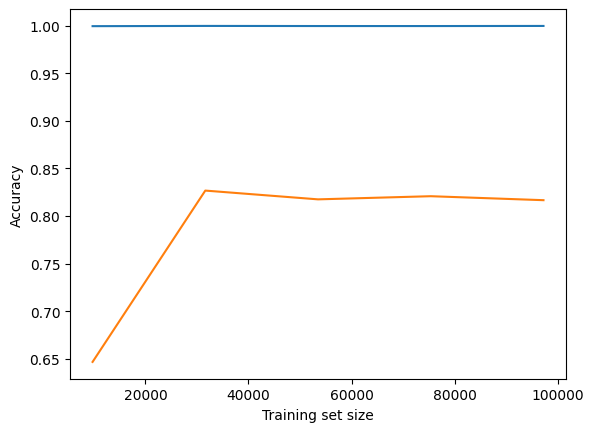

In [ ]:
from sklearn.model_selection import learning_curve

train_size_abs, train_scores, test_scores = learning_curve(tree, X_train, y_train, train_sizes=np.linspace(0.1, 1.0, 5))

train_scores_mean = np.mean(train_scores, axis=0)
test_scores_mean = np.mean(test_scores, axis=0)
plt.plot(train_size_abs, train_scores_mean, label='training')
plt.plot(train_size_abs, test_scores_mean, label='validation')
plt.xlabel('Training set size')
plt.ylabel('Accuracy')
plt.show()

Random forest has good results but a very high MSE

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics

rf = RandomForestRegressor()
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

rf_pca = RandomForestRegressor()
rf_pca.fit(X_train_pca, y_train)

y_pred = rf_pca.predict(X_test_pca)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

<ipython-input-122-40d28aa2389c>:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_train, y_train)


MSE: 67743042.90673576
R2: 0.8684415296472512


<ipython-input-122-40d28aa2389c>:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_pca.fit(X_train_pca, y_train)


MSE: 86199020.84064773
R2: 0.8325996170069774


Learning curve require a lot of time

In [ ]:
from sklearn.model_selection import learning_curve
from sklearn import metrics

train_size_abs, train_scores, test_scores = learning_curve(rf, X_train, y_train, train_sizes=np.linspace(0.1, 1.0, 5))

train_scores_mean = np.mean(train_scores, axis=0)
test_scores_mean = np.mean(test_scores, axis=0)
plt.plot(train_size_abs, train_scores_mean, label='training')
plt.plot(train_size_abs, test_scores_mean, label='validation')
plt.xlabel('Training set size')
plt.ylabel('Accuracy')
plt.show()

Tree models perform the best so we try gradient boosting

In [ ]:
categorical_mask = []
for c in X_train.columns:
    if len(X_train[c].unique()) == 2:
        categorical_mask.append(True)
    else:
        categorical_mask.append(False)

In [ ]:
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn import metrics

gboost = HistGradientBoostingRegressor(categorical_features=categorical_mask)
gboost.fit(X_train, y_train.values.ravel()) # to avoid DataConversionWarning

y_pred = gboost.predict(X_test)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

gboost_pca = HistGradientBoostingRegressor()
gboost_pca.fit(X_train_pca, y_train.values.ravel()) # to avoid DataConversionWarning

y_pred = gboost_pca.predict(X_test_pca)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

MSE: 47600030.49148214
R2: 0.907559700132972
MSE: 78550804.66609497
R2: 0.8474526200265873


R-squared of 90% and good-fit looking and the learning curves

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

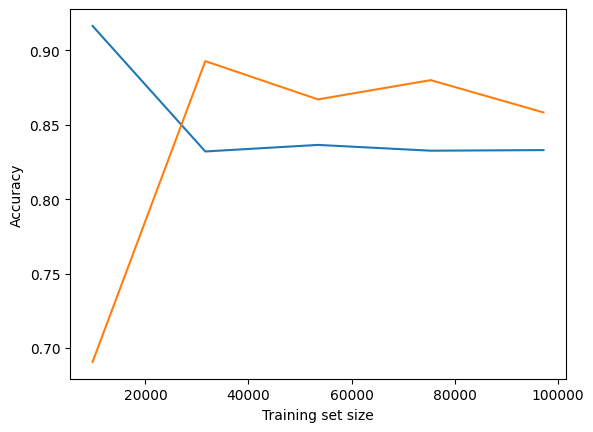

In [ ]:
from sklearn.model_selection import learning_curve

train_size_abs, train_scores, test_scores = learning_curve(gboost, X_train, y_train.values.ravel(), train_sizes=np.linspace(0.1, 1.0, 5))

train_scores_mean = np.mean(train_scores, axis=0)
test_scores_mean = np.mean(test_scores, axis=0)
plt.plot(train_size_abs, train_scores_mean, label='training')
plt.plot(train_size_abs, test_scores_mean, label='validation')
plt.xlabel('Training set size')
plt.ylabel('Accuracy')
plt.show()

## Build a neural network using PyTorch/TensorFlow/Sklearn

### Sklearn

In [ ]:
from sklearn.neural_network import MLPRegressor

nn = MLPRegressor(hidden_layer_sizes=(1000, 500, 120), batch_size=256, learning_rate_init=0.0001, max_iter=50, verbose=True)
nn.fit(X_train_pca, np.array(y_train))

y_pred = nn.predict(X_test_pca)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1623: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 796255075.72033346
Iteration 2, loss = 259973979.83307409
Iteration 3, loss = 125202910.13923885
Iteration 4, loss = 109619655.79833634
Iteration 5, loss = 102320900.56641932
Iteration 6, loss = 97755516.51077704
Iteration 7, loss = 94621280.18145359
Iteration 8, loss = 92248261.45833421
Iteration 9, loss = 90291642.39530207
Iteration 10, loss = 88600970.31752308
Iteration 11, loss = 87039690.15707727
Iteration 12, loss = 85557887.85698469
Iteration 13, loss = 84231191.87857983
Iteration 14, loss = 82874705.14624360
Iteration 15, loss = 81586819.80012541
Iteration 16, loss = 80344218.46218979
Iteration 17, loss = 79169959.47476947
Iteration 18, loss = 77957861.64340192
Iteration 19, loss = 76847735.70828369
Iteration 20, loss = 75737692.22354022
Iteration 21, loss = 74652384.04763743
Iteration 22, loss = 73638907.36645104
Iteration 23, loss = 72623440.19625148
Iteration 24, loss = 71640097.87247914
Iteration 25, loss = 70628406.13393851
Iteration 26, loss = 69682479

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


MSE: 22934822770.00297
R2: -43.53992723041638


### PyTorch

Make validation set

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X_train_pca, y_train, test_size=0.1)

print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)
print(X_test.shape)
print(y_test.shape)

(109431, 63)
(109431, 1)
(12160, 63)
(12160, 1)
(52647, 161)
(52647, 1)


Define model

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from sklearn import metrics

class NeuralNetwork(nn.Module):

    def __init__(self, n_input):
        super(NeuralNetwork, self).__init__()
        self.input = nn.Linear(n_input, 1000)
        self.layer_1 = nn.Linear(1000, 500)
        self.layer_2 = nn.Linear(500, 120)
        self.output = nn.Linear(120, 1)

        self.criterion = nn.MSELoss()
        self.optimizer = optim.Adam(self.parameters(), lr=0.0001)

    def forward(self, x):
        x = F.relu(self.input(x))
        x = F.relu(self.layer_1(x))
        x = F.relu(self.layer_2(x))
        x = self.output(x)
        return x

class NNRegression(nn.Module):

    def __init__(self, model):
        super(NNRegression, self).__init__()
        self.model = model

        self.train_epoch_loss = 0
        self.val_epoch_loss = 0
        self.loss_stats = {'train': [], 'val': []}

        self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

    def train(self, train_loader):
        self.model.train()
        for X_train_batch, y_train_batch in train_loader:

            X_train_batch, y_train_batch = X_train_batch.to(self.device), y_train_batch.to(self.device)
            self.model.optimizer.zero_grad()

            y_train_pred = self.model.forward(X_train_batch)
            train_loss = self.model.criterion(y_train_pred, y_train_batch)

            train_loss.backward()
            self.model.optimizer.step()

            self.train_epoch_loss += train_loss.item()

    def evaluate(self, val_loader):
        with torch.no_grad():

            self.model.eval()
            for X_val_batch, y_val_batch in val_loader:
                X_val_batch, y_val_batch = X_val_batch.to(self.device), y_val_batch.to(self.device)

                y_val_pred = self.model.forward(X_val_batch)
                val_loss = self.model.criterion(y_val_pred, y_val_batch)

                self.val_epoch_loss += val_loss.item()

    def test(self, test_loader, y_test):
        y_pred_list = []
        y_test = []

        with torch.no_grad():
            self.model.eval()
            for X_batch, y_batch in test_loader:
                X_batch = X_batch.to(self.device)
                y_batch = y_batch.to(self.device)
                y_test_pred = self.model.forward(X_batch)
                y_pred_list.append(y_test_pred.cpu().numpy())
                y_test.append(y_batch.cpu().numpy())

        y_pred_list = [a.squeeze().tolist() for a in y_pred_list]
        y_test = [a.squeeze().tolist() for a in y_test]

        print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred_list)))
        print('R2: {}'.format(metrics.r2_score(y_test, y_pred_list)))

    def fit(self, train_loader, val_loader, epochs):
        for e in range(epochs):
            self.train_epoch_loss = 0
            self.val_epoch_loss = 0

            self.train(train_loader)
            self.evaluate(val_loader)

            self.loss_stats['train'].append(self.train_epoch_loss/len(train_loader))
            self.loss_stats['val'].append(self.val_epoch_loss/len(val_loader))
            print(f'Epoch {e+0:03}: | Train Loss: {self.train_epoch_loss/len(train_loader):.5f} | Val Loss: {self.val_epoch_loss/len(val_loader):.5f}')

Wrap dataset

In [ ]:
from torch.utils.data import Dataset

class Dataset(Dataset):

    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data

    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]

    def __len__ (self):
        return len(self.X_data)

Neural network and parameters

In [ ]:
model = NeuralNetwork(len(X_train.columns))
nn_regression = NNRegression(model)
print(nn_regression)

batch_size = 256
epochs = 50

NNRegression(
  (model): NeuralNetwork(
    (input): Linear(in_features=63, out_features=1000, bias=True)
    (layer_1): Linear(in_features=1000, out_features=500, bias=True)
    (layer_2): Linear(in_features=500, out_features=120, bias=True)
    (output): Linear(in_features=120, out_features=1, bias=True)
    (criterion): MSELoss()
  )
)


Prepare dataloaders

In [ ]:
from torch.utils.data import DataLoader

train_dataset = Dataset(torch.from_numpy(np.array(X_train)).float(), torch.from_numpy(np.array(y_train)).float())
val_dataset = Dataset(torch.from_numpy(np.array(X_val)).float(), torch.from_numpy(np.array(y_val)).float())
test_dataset = Dataset(torch.from_numpy(np.array(X_test_pca)).float(), torch.from_numpy(np.array(y_test)).float())

train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

Training

In [ ]:
nn_regression.fit(train_loader, val_loader, epochs=epochs)
nn_regression.test(test_loader, y_test)

Epoch 000: | Train Loss: 734387508.52865 | Val Loss: 198026777.92876
Epoch 001: | Train Loss: 215925875.06199 | Val Loss: 162362952.22430
Epoch 002: | Train Loss: 196363595.01520 | Val Loss: 150817723.68680
Epoch 003: | Train Loss: 187828270.87251 | Val Loss: 143767156.57048
Epoch 004: | Train Loss: 181728877.26082 | Val Loss: 137585472.59416
Epoch 005: | Train Loss: 176127836.92749 | Val Loss: 132286975.05554
Epoch 006: | Train Loss: 170716064.78363 | Val Loss: 126466484.35261
Epoch 007: | Train Loss: 165581957.86082 | Val Loss: 121498062.72066
Epoch 008: | Train Loss: 160817636.20468 | Val Loss: 116720408.14160
Epoch 009: | Train Loss: 156267514.28187 | Val Loss: 112029141.79782
Epoch 010: | Train Loss: 152116638.91930 | Val Loss: 107587136.73299
Epoch 011: | Train Loss: 148032380.71988 | Val Loss: 103789033.54876
Epoch 012: | Train Loss: 144319285.89415 | Val Loss: 100012591.94362
Epoch 013: | Train Loss: 140701635.63626 | Val Loss: 96493837.85641
Epoch 014: | Train Loss: 137129220.

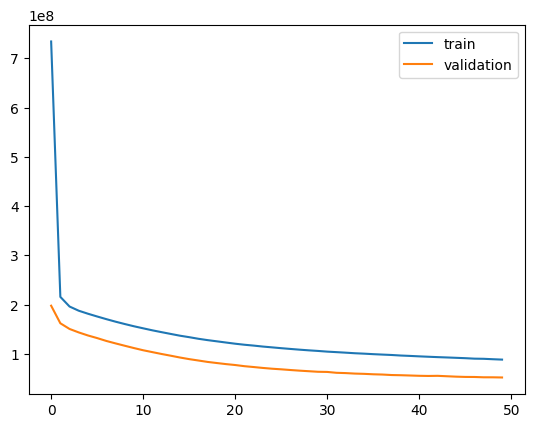

In [ ]:
plt.plot([*range(epochs)], nn_regression.loss_stats['train'], label='train')
plt.plot([*range(epochs)], nn_regression.loss_stats['val'], label='validation')
plt.legend()
plt.show()

### TensorFlow

Make validation set

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X_train_pca, y_train, test_size=0.1)

print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)
print(X_test.shape)
print(y_test.shape)

(109431, 63)
(109431, 1)
(12160, 63)
(12160, 1)
(52647, 161)
(52647, 1)


Define model

In [ ]:
import tensorflow as tf

from tensorflow.keras.layers import Dense, InputLayer
from tensorflow.keras.activations import relu
from tensorflow.keras.losses import mse
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import RootMeanSquaredError

from sklearn import metrics

model = tf.keras.Sequential([InputLayer(input_shape=len(X_train_pca.columns)),
                             Dense(units=1000, activation=relu),
                             Dense(units=500, activation=relu),
                             Dense(units=120, activation=relu),
                             Dense(units=1)])

print(model.summary())

model.compile(loss=mse, optimizer=Adam(), metrics=[RootMeanSquaredError()])

model.fit(tf.expand_dims(X_train_pca, axis=-1), y_train, epochs=50)

y_pred = model.predict(X_test_pca)
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_48 (Dense)            (None, 1000)              64000     
                                                                 
 dense_49 (Dense)            (None, 500)               500500    
                                                                 
 dense_50 (Dense)            (None, 120)               60120     
                                                                 
 dense_51 (Dense)            (None, 1)                 121       
                                                                 
Total params: 624,741
Trainable params: 624,741
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/50
3800/3800 [==============================] - 70s 18ms/step - loss: 206012896.0000 - root_mean_squared_error: 14353.1494
Epoch 2/50
3800/3800 [=====================

# Fine tuning

In [15]:
X_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_std.csv')
X_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_std.csv')
y_train = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_train.csv')
y_test = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/y_test.csv')
# dimensionality reduction
X_train_pca = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_train_pca.csv')
X_test_pca = pd.read_csv('/content/drive/MyDrive/datasets/New York Cars/X_test_pca.csv')

In [16]:
categorical_mask = []
for c in X_train.columns:
    if len(X_train[c].unique()) == 2:
        categorical_mask.append(True)
    else:
        categorical_mask.append(False)

Gradient Boosting is the best model so we try to find the best combination of hyperparameters (**a lot of time required**). The model can explain 90% of the data (actually independent varaibles can correctly predict 90% of the dependent variable) and the root mean squared error is 6,654\$ (approximately the 20% of mean price of the train set and the test set that is respectively 34,350.56\$ and 34,282.15\$).

In [ ]:
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

gboost = HistGradientBoostingRegressor(categorical_features=categorical_mask)
param_grid = {'learning_rate': (0.1, 0.01),
              'max_iter': (100, 150, 200),
              'max_leaf_nodes': (31, None),
              'l2_regularization': (0, 10)}

# param_grid = {'learning_rate': [0.1], 'max_iter': [200]}

reg = GridSearchCV(gboost, param_grid, verbose=4, n_jobs=-1, cv=2)
reg.fit(X_train, y_train.values.ravel())

y_pred = reg.predict(X_test)
print('RMSE: {}'.format(np.sqrt(metrics.mean_squared_error(y_test, y_pred))))
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

Fitting 2 folds for each of 1 candidates, totalling 2 fits
RMSE: 6654.000854939792
MSE: 44275727.37753948
R2: 0.9140155694576092


In [ ]:
gboost = HistGradientBoostingRegressor(categorical_features=categorical_mask, verbose=4, max_leaf_nodes=None, learning_rate=0.01, max_iter=2000)
gboost.fit(X_train, y_train.values.ravel())

y_pred = gboost.predict(X_test)
print('RMSE: {}'.format(np.sqrt(metrics.mean_squared_error(y_test, y_pred))))
print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
print('R2: {}'.format(metrics.r2_score(y_test, y_pred)))

Binning 0.141 GB of training data: 4.355 s
Binning 0.016 GB of validation data: 1.219 s
Fitting gradient boosted rounds:
[1/2000] 1 tree, 4138 leaves, max depth = 32, train loss: 256782581.01789, val loss: 478173836.02436, in 6.197s
[2/2000] 1 tree, 4142 leaves, max depth = 32, train loss: 252195884.79271, val loss: 473072700.98237, in 2.541s
[3/2000] 1 tree, 4125 leaves, max depth = 32, train loss: 247699783.61844, val loss: 468070118.37131, in 5.303s
[4/2000] 1 tree, 4147 leaves, max depth = 32, train loss: 243292492.89036, val loss: 463162962.82300, in 2.355s
[5/2000] 1 tree, 4137 leaves, max depth = 32, train loss: 238973878.87296, val loss: 458355634.17692, in 2.522s
[6/2000] 1 tree, 4165 leaves, max depth = 32, train loss: 234740421.33524, val loss: 453638856.17556, in 2.346s
[7/2000] 1 tree, 4139 leaves, max depth = 32, train loss: 230592954.01326, val loss: 449015284.81786, in 5.336s
[8/2000] 1 tree, 4139 leaves, max depth = 32, train loss: 226524392.65244, val loss: 444477938.

Gridsearch information and best model. We select a model considering a trade-off between performance and training time:
1. a learning rate of 0.1 makes the model converge in relatively a few iterations
2. 200 iterations are enough to obtain a R-squared of at least 91\%
3. limiting the number of leaves to 31 gives good results and reduces a lot the training time

In [ ]:
best_model = reg.best_estimator_
print(reg.best_params_)

pd.DataFrame(reg.cv_results_)

{'learning_rate': 0.1, 'max_iter': 200}


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_iter,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score
0,24.796497,0.228537,3.633421,0.021064,0.1,200,"{'learning_rate': 0.1, 'max_iter': 200}",0.808663,0.89514,0.851901,0.043239,1


Cross validation

In [39]:
from sklearn.model_selection import cross_validate

# concatenate train and test
X = np.concatenate((X_train, X_test))
y = np.concatenate((y_train, y_test))

# 5-fold cross validation
cv_results = cross_validate(best_model, X, y.ravel(), cv=5, return_train_score=True)
print('Train scores: {}, mean: {}, std: {}'.format(cv_results['train_score'], cv_results['train_score'].mean(), cv_results['train_score'].std()))
print('Test scores: {}, mean: {}, std: {}'.format(cv_results['test_score'], cv_results['test_score'].mean(), cv_results['test_score'].std()))

Train scores: [0.93113836 0.91287303 0.91375378 0.9128625  0.91426158], mean: 0.9169778501098073, std: 0.007100399677991718
Test scores: [0.75506611 0.91006501 0.9150084  0.90339942 0.91872635], mean: 0.8804530581546629, std: 0.06290342826278657


From the learning curves we notice that the model is a good fit

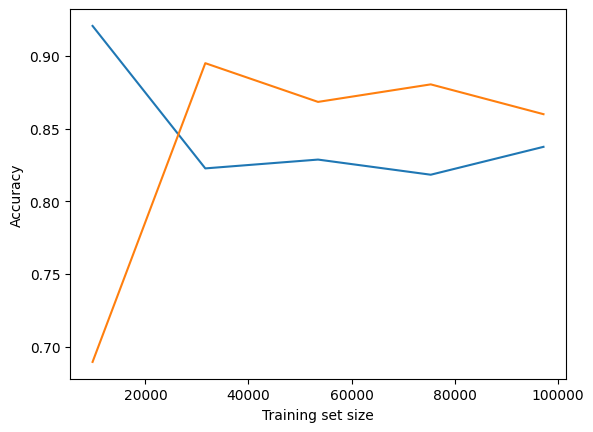

In [ ]:
from sklearn.model_selection import learning_curve

train_size_abs, train_scores, test_scores = learning_curve(best_model, X_train, y_train.values.ravel(), train_sizes=np.linspace(0.1, 1.0, 5))

train_scores_mean = np.mean(train_scores, axis=0)
test_scores_mean = np.mean(test_scores, axis=0)
plt.plot(train_size_abs, train_scores_mean, label='training')
plt.plot(train_size_abs, test_scores_mean, label='validation')
plt.xlabel('Training set size')
plt.ylabel('Accuracy')
plt.show()

From the validation curve a learning rate of 0.1 is a good choice. There are other parameters to test (**a lot of time**)

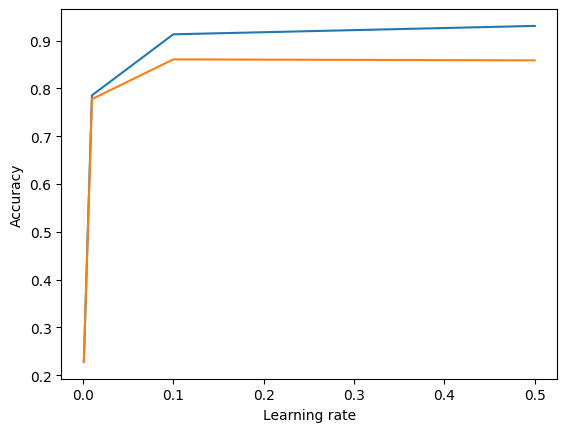

In [29]:
from sklearn.model_selection import validation_curve

lr_values = [0.001, 0.01, 0.1, 0.5]
train_scores, test_scores = validation_curve(best_model, X_train, y_train.values.ravel(), param_name='learning_rate', param_range=lr_values)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
plt.plot(lr_values, train_scores_mean, label='training')
plt.plot(lr_values, test_scores_mean, label='validation')
plt.xlabel('Learning rate')
plt.ylabel('Accuracy')
plt.show()

Feature importance using permutation. The box plot shows the mean importance of the first 10 features.

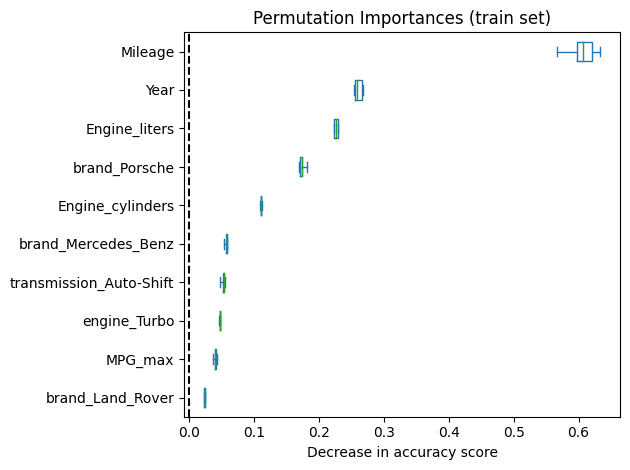

In [10]:
from sklearn.inspection import permutation_importance

result_train = permutation_importance(best_model, X_train, y_train, n_repeats=5, n_jobs=-1)

sorted_importances_idx = result_train.importances_mean.argsort()[-10:]

importances = pd.DataFrame(result_train.importances[sorted_importances_idx].T, columns=X_train.columns[sorted_importances_idx])

ax = importances.plot.box(vert=False, whis=10)
ax.set_title('Permutation Importances (train set)')
ax.axvline(x=0, color='k', linestyle='--')
ax.set_xlabel('Decrease in accuracy score')
ax.figure.tight_layout()

In [11]:
sorted_importances_idx = result_train.importances_mean.argsort()
importances = pd.DataFrame(result_train.importances[sorted_importances_idx].T, columns=X_train.columns[sorted_importances_idx])
importances

,engine_Cvvt,transmission_Shiftronic,engine_Unleaded,transmission_M/T,transmission_Controlled,transmission_Geartronic,transmission_Sport,new&used_Buick Certified,transmission_Sequential,transmission_Sportmatic,...,brand_Land_Rover,MPG_max,engine_Turbo,transmission_Auto-Shift,brand_Mercedes_Benz,Engine_cylinders,brand_Porsche,Engine_liters,Year,Mileage
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.024127,0.040903,0.046858,0.051256,0.053746,0.111492,0.180653,0.222996,0.254634,0.606590
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.023071,0.036257,0.045443,0.054556,0.057453,0.107992,0.168963,0.222128,0.253726,0.633396
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.022447,0.042134,0.047212,0.046613,0.058104,0.110618,0.173657,0.228588,0.258392,0.620664
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.023731,0.039957,0.046703,0.053484,0.057705,0.110114,0.173594,0.226603,0.268306,0.566822
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.024055,0.039066,0.046707,0.053046,0.056577,0.109961,0.170046,0.228446,0.266396,0.597065


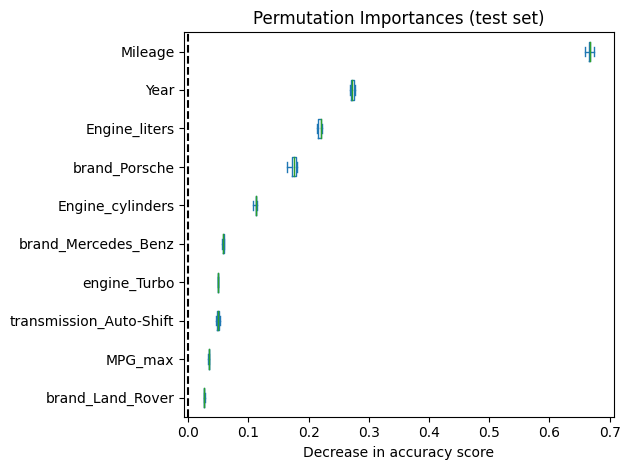

In [12]:
result_test = permutation_importance(best_model, X_test, y_test, n_repeats=5, n_jobs=-1)

sorted_importances_idx = result_test.importances_mean.argsort()[-10:]

importances = pd.DataFrame(result_test.importances[sorted_importances_idx].T, columns=X_train.columns[sorted_importances_idx])

ax = importances.plot.box(vert=False, whis=10)
ax.set_title('Permutation Importances (test set)')
ax.axvline(x=0, color='k', linestyle='--')
ax.set_xlabel('Decrease in accuracy score')
ax.figure.tight_layout()

In [13]:
sorted_importances_idx = result_test.importances_mean.argsort()
importances = pd.DataFrame(result_test.importances[sorted_importances_idx].T, columns=X_train.columns[sorted_importances_idx])
importances

,transmission_Automatic,safety_Blind Spot Monitor,Fuel type_Unspecified,new&used_Buick Certified,new&used_Bmw Certified,new&used_Acura Certified,engine_I-Force,engine_Turbodiesel,engine_Ecotec3,engine_Biturbo,...,brand_Land_Rover,MPG_max,transmission_Auto-Shift,engine_Turbo,brand_Mercedes_Benz,Engine_cylinders,brand_Porsche,Engine_liters,Year,Mileage
0,-0.000102,-0.000022,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.027427,0.033179,0.051148,0.049579,0.055842,0.112390,0.180233,0.221571,0.272616,0.666382
1,-0.000101,0.000015,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.025699,0.033668,0.048004,0.048748,0.057956,0.111832,0.179701,0.220055,0.270773,0.667256
2,-0.000115,-0.000174,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.026761,0.034258,0.051997,0.048979,0.058954,0.112910,0.176284,0.213554,0.276897,0.658586
3,-0.000139,0.000094,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.026130,0.034097,0.049447,0.050189,0.058198,0.113901,0.172938,0.216117,0.268378,0.666894
4,-0.000140,-0.000035,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.026780,0.034338,0.045457,0.049240,0.059759,0.108326,0.164458,0.220003,0.275303,0.673998


Save the model

In [ ]:
import joblib

joblib.dump(best_model, '/content/drive/MyDrive/datasets/New York Cars/model.joblib')

['/content/drive/MyDrive/datasets/New York Cars/model.joblib']

# Production

Load the model

In [ ]:
import joblib

model = joblib.load('/content/drive/MyDrive/datasets/New York Cars/model.joblib')
model

HistGradientBoostingRegressor(categorical_features=[False, True, False, False,
                                                    False, False, False, False,
                                                    True, True, True, True,
                                                    True, True, True, True,
                                                    True, True, True, True,
                                                    True, True, True, True,
                                                    True, True, True, True,
                                                    True, True, ...],
                              max_iter=200)